In [1]:
using Base.Threads
println("Usando ", nthreads(), " threads 😎")

Usando 12 threads 😎


In [2]:
import Pkg; Pkg.add("Revise")

┌ Warning: could not download https://pkg.julialang.org/registries
│   exception = Downloads.RequestError("https://pkg.julialang.org/registries", 35, "Recv failure: Connection was reset", Downloads.Response("https", "https://eu-central.pkg.julialang.org/registries", 301, "HTTP/1.1 301 EU internal redirect trigger", ["connection" => "close", "content-length" => "0", "server" => "Varnish", "retry-after" => "0", "location" => "https://eu-central.pkg.julialang.org/registries", "x-geo-continent" => "EU", "x-geo-country" => "ES", "x-geo-region" => "B", "accept-ranges" => "bytes", "date" => "Wed, 01 Jul 2026 07:26:02 GMT", "via" => "1.1 varnish", "x-served-by" => "cache-mad2200090-MAD", "x-cache" => "HIT", "x-cache-hits" => "0", "x-timer" => "S1782890762.263694,VS0,VE1"]))
└ @ Pkg.Registry C:\Users\u256063\AppData\Local\Programs\Julia-1.12.5\share\julia\stdlib\v1.12\Pkg\src\Registry\Registry.jl:83
    Updating registry at `C:\Users\u256063\.julia\registries\General.toml`
   Resolving package 

In [3]:
import Pkg

# Pkg.activate("C:/Users/julia/OneDrive/Escritorio/phd/Bacteria_ABM/ABM_CBM/")
Pkg.activate("./../../")
Pkg.resolve()
Pkg.instantiate()
Pkg.precompile()

# ENV["JULIA_CUDA_USE_BINARYBUILDER"] = false

# using CUDA
# CUDA.set_runtime_version!(v"12.2")

using Revise
using CellBasedModels
using Distributions
using CairoMakie
using JSON
using JLD2

import CairoMakie: Point3f, Cylinder, Sphere, NoShading

CairoMakie.activate!()

  Activating project at `c:\Users\u256063\Desktop\Projects\ColonyPGA\ABM_CBM`
     Project No packages added to or removed from `C:\Users\u256063\Desktop\Projects\ColonyPGA\ABM_CBM\Project.toml`
    Manifest No packages added to or removed from `C:\Users\u256063\Desktop\Projects\ColonyPGA\ABM_CBM\Manifest.toml`


In [4]:
# using GeometryBasics, Makie

view_dir(az, el) = Vec3f(cos(az)*cos(el), sin(az)*cos(el), sin(el))

function painter_perm(ax::Axis3, x, y, z)
    az = ax.azimuth[]; el = ax.elevation[]
    v  = view_dir(az, el)
    depths = x .* v[1] .+ y .* v[2] .+ z .* v[3]
    sortperm(depths; rev=false)  # far → near (lejos → cerca)
end

function plotAgents3D_auto!(ax, x, y, z, d, l, theta, phi, p; colormap=:inferno, colorrange=(0,1), kwargs...)
    perm = painter_perm(ax, x, y, z)
    for i in perm
        xi, yi, zi = x[i], y[i], z[i]
        di, li = d[i], l[i]
        thetai, phii, pi = theta[i], phi[i], p[i]

        ux = cos(thetai) * cos(phii)
        uy = sin(thetai) * cos(phii)
        uz = sin(phii)

        x_plus  = xi + 0.5li*ux; y_plus  = yi + 0.5li*uy; z_plus  = zi + 0.5li*uz
        x_minus = xi - 0.5li*ux; y_minus = yi - 0.5li*uy; z_minus = zi - 0.5li*uz
        r = Float32(di/2)

        mesh!(ax, Sphere(Point3f(x_plus,  y_plus,  z_plus),  r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Sphere(Point3f(x_minus, y_minus, z_minus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)
        mesh!(ax, Cylinder(Point3f(x_minus, y_minus, z_minus), Point3f(x_plus, y_plus, z_plus), r);
             color=pi, colormap=colormap, colorrange=colorrange, kwargs...)

    end
    return
end




plotAgents3D_auto! (generic function with 1 method)

# Terracing


In [5]:
@inline function du_dtheta(theta, phi)
    (-cos(phi)*sin(theta),  cos(phi)*cos(theta),  0.0)
end
@inline function du_dphi(theta, phi)
    (-sin(phi)*cos(theta), -sin(phi)*sin(theta),  cos(phi))
end

@inline dot3(a,b) = a[1]*b[1] + a[2]*b[2] + a[3]*b[3]


# --- Utilidades de orientación y polos (orden fijo: + y −) ---
@inline function rod_dir3d(theta, phi)
    cx = cos(theta); sx = sin(theta)
    cp = cos(phi);   sp = sin(phi)
    return (cx*cp, sx*cp, sp)               # u = (cosθ cosφ, sinθ cosφ, sinφ)
end


@inline function rod_poles3d_ordered(x,y,z,l,theta,phi)
    ux,uy,uz = rod_dir3d(theta, phi)
    hx,hy,hz = 0.5l*ux, 0.5l*uy, 0.5l*uz
    return (x+hx, y+hy, z+hz), (x-hx, y-hy, z-hz)  # (+, −)
end


rod_poles3d_ordered (generic function with 1 method)

In [6]:
rod3D_grow = ABM(3,
    agent = Dict(
            :theta=>Float64,
            :phi =>Float64,
            :d=>Float64,
            :l=>Float64,
            :fx=>Float64,
            :fy=>Float64,
            :fz=>Float64,
            :Wtheta=>Float64,
            :Wphi=>Float64,
            :lTarget => Float64,
            :V => Float64,

        ),    #Local Interaction Parameters

    model = Dict(
            :Ebb =>Float64,
            :eta =>Float64,
            :eps =>Float64,
            :gamma =>Float64,
            :lMax => Float64,
            :σlTarget => Float64,
            :Ebv => Float64,
            :g => Float64,
            :h0 => Float64,
            :Ebp => Float64,
            :alpha_HP =>Float64,
            :K_HP =>Float64,
            :D_HP =>Float64,
            :D_PhrF =>Float64,
            :alpha_PhrF =>Float64,
            :delta_PhrF =>Float64,
            :beta_PhrF =>Float64,
            :K_PhrF =>Float64,
            :Kc =>Float64,
            :beta_c =>Float64,
            :D_c =>Float64,
            :c0 =>Float64,
            :gamma_c => Float64,
            :eps_cs =>Float64,
            :gamma_cs =>Float64,
            :D_H =>Float64,
            :alpha_H =>Float64,
            :KpqC =>Float64,
            :delta_H =>Float64,
            :alpha_PhrC =>Float64,
            :alpha_PGA =>Float64,
            :D_PhrC =>Float64,
            :D_PGA =>Float64,
            :delta_PhrC =>Float64,
            :delta_PGA =>Float64,
            :npqC => Int,
            :alpha_V => Float64,
            :delta_V => Float64,
            :beta_V => Float64,
            :KVc => Float64,
            :nV => Int,
            :npc => Int,
            :growth=>Float64,
            :Kpc => Float64,
            :v => Float64,
            :KPGA => Float64,
            :nPGA =>Int,
            :A => Float64,



        ),        #Global parameters

    medium = Dict(
            :HPad => Float64,
            :PPad => Float64,
            :c => Float64,
            :H => Float64,
            :Hx => Float64,
            :Hy => Float64,
            :PGA => Float64,
            :PhrF => Float64,
        ),

    agentODE = quote

        fx = 0
        fy = 0
        fz = 0
        Wtheta = 0
        Wphi = 0 

        
        hPad = HPad

        hbac = exp(2*(hPad-z-d/2))
        if hPad>z+d/2
            cbac=c*exp(-gamma_c*(hPad-z-d/2))
            
        else
            cbac=c
        end
        
        dt(l) = l*growth*cbac/(Kc+cbac)
        dt(V)= alpha_V - delta_V*V + beta_V*(hbac)^nV/((KVc)^nV+(hbac)^nV)

        
        

        @loopOverNeighbors i2 begin

            #Use the model provided in the documentation
            Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.repulsiveForces_rods3d_asym(x,y,z,d,l,theta, phi,
                                    x[i2],y[i2],z[i2],d[i2],l[i2],theta[i2], phi[i2], eta, Ebb, A,mu_rot=1/(eta*A*1))

            #Append the repulsive forces
            fx += Fijx
            fy += Fijy
            fz += Fijz
            Wtheta += Wijtheta
            Wphi += Wijphi

   
            
        end

        

        Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.substrateAttraction_rods_yukawa3d(x,y,z,d,l,theta,phi, 
            eta, eps_cs,gamma_cs,A,mu_rot=1/(eta*A*1))

                    #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   
        
        Fijx, Fijy, Fijz, Wijtheta, Wijphi = CBMModels.substrateRepulsion_rods3d(x,y,z,d,l,theta,phi, 
            eta, Ebv, A,mu_rot=1/(eta*A*1))

        #Append the repulsive forces
        fx += Fijx
        fy += Fijy
        fz += Fijz
        Wtheta += Wijtheta
        Wphi += Wijphi   

        ###########################
        # H
        ###########################

        # orientación del rod
        ux = cos(theta) * cos(phi)
        uy = sin(theta) * cos(phi)
        uz = sin(phi)

        # movilidad anisótropa
        mu_par  = 1.0 / eta
        mu_perp = 1.0 / (eta * A)
        mu_rot  = 1.0 / (eta * A)   # o el valor que estés usando

        # grid spacing del campo
        hx = (simBox[1,2] - simBox[1,1]) / NMedium[1]
        hy = (simBox[2,2] - simBox[2,1]) / NMedium[2]
        Δs_eff = 0.5 * min(hx, hy)

        # discretización del rod
        K = max(2, ceil(Int, l / Δs_eff))
        Δs = l / (K - 1)

        # acumuladores
        vx_H = 0.0
        vy_H = 0.0
        vz_H = 0.0
        Wθ_H = 0.0
        Wφ_H = 0.0

        for s in LinRange(-l/2, l/2, K)
            # punto sobre el rod
            xp = x + s * ux
            yp = y + s * uy
            zp = z + s * uz

            # índice de la celda donde cae el punto
            idx = Int(floor(Int, xp/(simBox[1,2]-simBox[1,1])*NMedium[1]) + NMedium[1]/2)
            if mod(xp, (simBox[1,2]-simBox[1,1])/NMedium[1]) > 0
                idx += 1
            end

            idy = Int(floor(Int, yp/(simBox[2,2]-simBox[2,1])*NMedium[2]) + NMedium[2]/2)
            if mod(yp, (simBox[2,2]-simBox[2,1])/NMedium[2]) > 0
                idy += 1
            end

            idx = clamp(idx, 1, NMedium[1])
            idy = clamp(idy, 1, NMedium[2])

            # campo local en ese punto del rod
            Hx_p = com.Hx[idx, idy, 1]
            Hy_p = com.Hy[idx, idy, 1]

            # fuerza geométrica local
            Fgx = -v * Hx_p / (l + d)
            Fgy = -v * Hy_p / (l + d)
            Fgz = 0.0

            # movilidad anisótropa
            u_dot_F = ux*Fgx + uy*Fgy + uz*Fgz

            vx_loc = mu_perp * Fgx + (mu_par - mu_perp) * u_dot_F * ux
            vy_loc = mu_perp * Fgy + (mu_par - mu_perp) * u_dot_F * uy
            vz_loc = mu_perp * Fgz + (mu_par - mu_perp) * u_dot_F * uz

            vx_H += vx_loc
            vy_H += vy_loc
            vz_H += vz_loc

            # torque geométrico local: τ = r × F
            rx = xp - x
            ry = yp - y
            rz = zp - z

            τx = ry*Fgz - rz*Fgy
            τy = rz*Fgx - rx*Fgz
            τz = rx*Fgy - ry*Fgx

            # proyección angular
            duθx, duθy, duθz = du_dtheta(theta, phi)
            duφx, duφy, duφz = du_dphi(theta, phi)

            sθx = uy*duθz - uz*duθy
            sθy = uz*duθx - ux*duθz
            sθz = ux*duθy - uy*duθx

            sφx = uy*duφz - uz*duφy
            sφy = uz*duφx - ux*duφz
            sφz = ux*duφy - uy*duφx

            scale = 12.0 * mu_rot / ((l + d)^2)

            Wθ_H += scale * (τx*sθx + τy*sθy + τz*sθz)
            Wφ_H += scale * (τx*sφx + τy*sφy + τz*sφz)
        end

        # integración a lo largo del rod
        fx += vx_H * Δs
        fy += vy_H * Δs
        fz += vz_H * Δs
        Wtheta += Wθ_H * Δs
        Wphi += Wφ_H * Δs
        # # fuerza geométrica en el plano xy
        # Fgx = -v * Hx / ((l + d)*eta)
        # Fgy = -v * Hy / ((l + d)*eta)


        # fx += Fgx
        # fy += Fgy
        # fz += 0

        ############################
        # Pad interaction
        ############################

        Fijx = 0.0; Fijy = 0.0; Fijz = 0.0
        Wijtheta = 0.0; Wijphi = 0.0

        # # orientación del rod
        # ux = cos(theta)*cos(phi)
        # uy = sin(theta)*cos(phi)
        # uz = sin(phi)

        # grid spacing
        hx = (simBox[1,2] - simBox[1,1]) / NMedium[1]
        hy = (simBox[2,2] - simBox[2,1]) / NMedium[2]
        Δs_eff = 0.5 * min(hx, hy)

        # recorrer s en [-l/2, l/2]
        K = max(2, ceil(Int, l / Δs_eff))
        Δs = l / (K - 1)

        for s in LinRange(-l/2, l/2, K)
            # punto sobre el rod
            xp = x + s*ux
            yp = y + s*uy
            zp = z + s*uz

            # celda del pad
            idx = Int(floor(Int, xp/(simBox[1,2]-simBox[1,1])*NMedium[1]) + NMedium[1]/2)
            if mod(xp, (simBox[1,2]-simBox[1,1])/NMedium[1]) > 0
                idx += 1
            end

            idy = Int(floor(Int, yp/(simBox[2,2]-simBox[2,1])*NMedium[2]) + NMedium[2]/2)
            if mod(yp, (simBox[2,2]-simBox[2,1])/NMedium[2]) > 0
                idy += 1
            end

            # opcional pero recomendable: clamp para evitar salirte de rango
            idx = clamp(idx, 1, NMedium[1])
            idy = clamp(idy, 1, NMedium[2])

            # altura local del pad
            hPad = com.HPad[idx, idy, 1]

            # contacto con pad superior
            if hPad < zp + d/2
                vx_p, vy_p, vz_p, Wθ_p, Wφ_p, Fz_geom = CBMModels.padRepulsion_rods_point_3d(
                    x, y, z,         # CM bacteria
                    xp, yp, zp,      # punto sobre el rod
                    d, l, theta, phi,
                    eta, Ebp, hPad, A, mu_rot=1/(eta*A*1)
                )

                # acumula contribución a la bacteria (velocidades)
                Fijx += vx_p
                Fijy += vy_p
                Fijz += vz_p
                Wijtheta += Wθ_p
                Wijphi += Wφ_p

                # reacción sobre el pad:
                # Fz_geom = fuerza geométrica del pad sobre la bacteria (normalmente < 0)
                # -Fz_geom = fuerza de la bacteria sobre el pad (normalmente > 0)
                com.PPad[idx, idy, 1] += (-Fz_geom) * Δs
            end
        end

        # integrar a lo largo del rod
        fx += Fijx * Δs
        fy += Fijy * Δs
        fz += Fijz * Δs
        Wtheta += Wijtheta * Δs
        Wphi += Wijphi * Δs


        # ww1 = CBMDistributions.uniform(-1,1)*10^(-3)
        # ww2 = CBMDistributions.uniform(-1,1)*10^(-3)
        # ww3 = CBMDistributions.uniform(-1,1)*10^(-6)

        #Equations
        dt(x) =  fx 
        dt(y) =  fy 
        dt(z) =  fz 
        dt(theta) =  Wtheta 
        dt(phi) = Wphi
    end,

    agentRule = quote #Bound cells

        #Add division
        if l > lTarget
           

            # Dirección 3D de la varilla (unitaria)
            ux = cos(theta)*cos(phi)
            uy = sin(theta)*cos(phi)
            uz = sin(phi)

            # === Hija A (delantera, +u) ===
            @addAgent(
                x = x + (l+d)/4 * ux,
                y = y + (l+d)/4 * uy,
                z = z + (l+d)/4 * uz,
                l = (l-d)/2,
                Wtheta =  CBMDistributions.uniform(-1,1)*10^(-2),
                # Wphi= ww2,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
            )

            # === Hija B (trasera, −u) ===
            @addAgent(
                x = x - (l+d)/4 * ux,
                y = y - (l+d)/4 * uy,
                z = z - (l+d)/4 * uz,
                l = (l-d)/2,
                Wtheta =  CBMDistributions.uniform(-1,1)*10^(-2),
                # Wphi= ww2,
                lTarget = CBMDistributions.uniform(lMax-σlTarget, lMax+σlTarget),
            )

            # Elimina célula madre
            @removeAgent()
        end


        
        if HPad >z+d/2
            cbac =c*exp(-gamma_c*(HPad-z-d/2))
        else
            cbac = c
        end
        c += (-l*beta_c*cbac/(Kc+cbac))*dt


        PGA += (alpha_PGA*PhrF/(K_PhrF+PhrF))*dt
        PhrF += (alpha_PhrF-beta_PhrF*PhrF)*dt
        
    end,

    mediumODE=quote 

            
        if @mediumBorder(1,-1) 
            HPad = h0
            c = c[2,i2_]
            PGA= PGA[2,i2_]
            H=0
            PhrF=PhrF[2,i2_]
        elseif @mediumBorder(1, 1)
            HPad = h0
            c = c[end-1,i2_]
            PGA= PGA[end-1,i2_]
            PhrF=PhrF[end-1,i2_]
            H=0

        elseif @mediumBorder(2,-1)
            HPad = h0
            c = c[i1_,2]
            PGA= PGA[i1_,2]
            PhrF=PhrF[i1_,2]
            H=0

        elseif @mediumBorder(2, 1)
            HPad = h0
            c = c[i1_,end-1]
            PGA= PGA[i1_,end-1]
            PhrF=PhrF[i1_,end-1]
            H=0

        else
            dt(HPad) = alpha_HP*PPad - K_HP*(HPad-h0) + D_HP*(@∂2(1,HPad)+@∂2(2,HPad))
            dt(c) =D_c*(@∂2(1,c)+@∂2(2,c))
            dt(H) = D_H*(@∂2(1,H)+@∂2(2,H)) + alpha_H*PGA^nPGA/(PGA^nPGA+KPGA^nPGA)- delta_H*H 
            dt(PGA) = D_PGA*(@∂2(1,PGA)+@∂2(2,PGA)) - delta_PGA*PGA
            dt(PhrF) = D_PhrF*(@∂2(1,PhrF)+@∂2(2,PhrF)) - delta_PhrF*PhrF

            Hx = @∂(1,H) 
            Hy = @∂(2,H)
            
        end
    end,
    # neighborsAlg=CBMNeighbors.VerletDisplacement(skin=4.0, nMaxNeighbors=500),
    neighborsAlg=CBMNeighbors.CellLinked(cellEdge=10),
    mediumAlg=DifferentialEquations.Euler(),
    platform=CPU(),
    agentAlg = CBMIntegrators.Heun()
);


In [7]:
com = Community(rod3D_grow,
            N=2,
            dt=0.0001,
            simBox = [-100 100;-100 100.; -100 100],
            NMedium=[200,200,1],
            );


#Natural units scales
m = 1.E3 #g
t = 1/(60*60) # h
d = 1.E6 #um

t_reescale = 0.5 #h
t_reescale = 8/17 #h

com.Ebb=1* 1.E6 *m/(t^2*d)*t_reescale^2 #Pa 
com.eta = 200 *m/(t^2*d)*t_reescale #Pa h
com.eps = 1.E3 *m/(t^2*d)*t_reescale^2 #Pa um^4
com.eps = 0 #Pa um^4
com.gamma=3

com.Ebv = com.Ebb *10 
com.Ebp =  com.Ebb*0.001

com.eps_cs = 5*1.E3 *m/(t^2*d)*t_reescale^2 #Pa um^4
com.gamma_cs=1

com.growth = 2 *t_reescale
com.lMax = 5.     
com.σlTarget = 2

com.d = 1.        
com.l[1] = 4.99      
com.l[2] = 2.5      
com.lTarget = 5.  
com.theta[1]=0
com.theta[2]=+pi/4
com.x[1]=-((com.l[1]+ com.d[1]) ./2) .* cos(com.theta[1])
com.y[1]=0
com.x[2]=((com.l[2]+ com.d[2]) ./2) .* cos(com.theta[2])
com.y[2]=((com.l[2]+ com.d[2]) ./2) .* sin(com.theta[2])
# com.z=com.d/2
# com.phi=0
# com.theta=0
# com.x=0
# com.y=0
com.z=com.d/2
com.phi=0


com.h0=0
com.alpha_HP=300*10^(-6) /t_reescale
com.K_HP=100*t_reescale
com.D_HP=500*t_reescale
com.PPad=0
com.HPad=1


com.H=0
# com.alpha_H = 10
com.alpha_H = 50*t_reescale
com.delta_H = 10*t_reescale*1
com.D_H = 5*t_reescale
com.npc = 10
com.v = 2.5*10^9*t_reescale^2
# com.v = 2.5*10^8*t_reescale^2
# com.v = 7.5*10^7*t_reescale^2
com.Kpc=0.01

com.KpqC=0.2
com.npqC=4

com.KPGA=0.04
com.nPGA=10

com.V=1
com.alpha_V=10
com.delta_V=10
com.beta_V=20
com.KVc=4
com.nV=10


com.D_c = 1500*t_reescale
com.c0 = 1 #Medium concentration
com.c = com.c0 
com.Kc = 1 #Half saturation constant for the medium
com.beta_c = 4*t_reescale #Growth rate of the cells in the medium
com.gamma_c = 5 #Decay with height constant


com.A=2


com.PGA=0
com.alpha_PGA = 1*t_reescale
com.delta_PGA = 0.1*t_reescale
com.D_PGA = 1000*t_reescale

com.D_PhrF = 1000*t_reescale
# com.alpha_PhrF = 10*t_reescale
com.alpha_PhrF = 0*t_reescale
com.delta_PhrF = 0.1*t_reescale
com.beta_PhrF = 1*t_reescale
com.K_PhrF = 1
com.PhrF = 1




1

In [8]:
1500*t_reescale


705.8823529411765

In [9]:
# com = Community(rod3D_grow,
#             N=1,
#             dt=0.0001,
#             simBox = [-100 100;-100 100.; -100 100],
#             NMedium=[200,200,1],
#             );


# #Natural units scales
# m = 1.E3 #g
# t = 1/(60*60) # h
# d = 1.E6 #um

# t_reescale = 0.5 #h

# com.Ebb=1* 1.E6 *m/(t^2*d)*t_reescale^2 #Pa 
# com.eta = 200 *m/(t^2*d)*t_reescale #Pa h
# com.eps = 1.E3 *m/(t^2*d)*t_reescale^2 #Pa um^4
# com.eps = 0 #Pa um^4
# com.gamma=3

# com.Ebv = com.Ebb *10 
# com.Ebp =  com.Ebb*0.001

# com.eps_cs = 5*1.E3 *m/(t^2*d)*t_reescale^2 #Pa um^4
# com.gamma_cs=1

# com.growth = 2 *t_reescale
# com.lMax = 5.     
# com.σlTarget = 2

# com.d = 1.        
# com.l[1] = 4.99      
# # com.l[2] = 2.5      
# com.lTarget = 5.  
# com.theta[1]=pi/2
# # com.theta[2]=0
# com.x=(com.l+ com.d) ./2 .* cos.(com.theta)
# com.y=0
# # com.z=com.d/2
# # com.phi=0
# # com.theta=0
# # com.x=0
# # com.y=0
# com.z=com.d/2
# com.phi=0


# com.h0=0
# com.alpha_HP=300*10^(-6) /t_reescale
# com.K_HP=100*t_reescale
# com.D_HP=500*t_reescale
# com.PPad=0
# com.HPad=1


# com.PGA=0
# # com.alpha_PGA = 10
# com.alpha_PGA = 50*t_reescale
# com.delta_PGA = 1*t_reescale
# com.D_PGA = 5*t_reescale
# com.npc = 10
# com.v = 2.5*10^9*t_reescale^2
# com.Kpc=0.01

# com.KpqC=0.2
# com.npqC=4

# com.KpqF=0.1
# com.npqF=10

# com.V=1
# com.alpha_V=10
# com.delta_V=10
# com.beta_V=20
# com.KVc=4
# com.nV=10


# com.D_c = 1000*t_reescale
# com.c0 = 1 #Medium concentration
# com.c = com.c0 
# com.Kc = 1 #Half saturation constant for the medium
# com.beta_c = 4*t_reescale #Growth rate of the cells in the medium
# com.gamma_c = 5 #Decay with height constant





# com.PhrF=0
# com.alpha_PhrF = 1*t_reescale
# com.delta_PhrF = 0.1*t_reescale
# com.D_PhrF = 1500*t_reescale




In [10]:

function save_step!(file, parameters, step)
    grp = JLD2.Group(file, "step_$step")
    for (k,v) in parameters
        grp[string(k)] = v
    end
end

save_step! (generic function with 1 method)

In [11]:
t_reescale

0.47058823529411764

In [12]:
using JLD2

steps = Int(round(10/t_reescale/com.dt))
saveEach = Int(round(1/t_reescale/com.dt)) ÷ 10

prev_steps = Int(round(0/t_reescale/com.dt))


jldopen("simulation_rescuePhrF.jld2","w") do file

    N = com.N * 4 
    loadToPlatform!(com, preallocateAgents=N)

    step = prev_steps

    while (step < steps+1) && (com.N < 3000)

        step!(com)

        if step % saveEach == 0

            bringFromPlatform!(com)

            if N - com.N[1] <= 0
                println("Step ",step," N: ",com.N[1]," preallocateAgents: ",N)
                @warn "More agents than preallocateAgents, stopping simulation."
                break

            elseif N - com.N[1] < 4*com.N[1]
                N = 15 * com.N[1]
            end

            println("Step ",step," N: ",com.N[1])

            save_step!(file, com.parameters, step)

            loadToPlatform!(com, preallocateAgents=N)
        end

        step += 1
        com.PPad = 0
    end

    bringFromPlatform!(com)

end

Step 0 N: 2
Step 2125 N: 3
Step 4250 N: 3
Step 6375 N: 3
Step 8500 N: 3
Step 10625 N: 3
Step 12750 N: 3
Step 14875 N: 4
Step 17000 N: 4
Step 19125 N: 4
Step 21250 N: 4
Step 23375 N: 4
Step 25500 N: 6
Step 27625 N: 6
Step 29750 N: 6
Step 31875 N: 7
Step 34000 N: 7
Step 36125 N: 8
Step 38250 N: 8
Step 40375 N: 8
Step 42500 N: 10
Step 44625 N: 11
Step 46750 N: 12
Step 48875 N: 13
Step 51000 N: 14
Step 53125 N: 15
Step 55250 N: 18
Step 57375 N: 19
Step 59500 N: 21
Step 61625 N: 23
Step 63750 N: 24
Step 65875 N: 24
Step 68000 N: 25
Step 70125 N: 29
Step 72250 N: 32
Step 74375 N: 33
Step 76500 N: 37
Step 78625 N: 44
Step 80750 N: 46
Step 82875 N: 47
Step 85000 N: 49
Step 87125 N: 52
Step 89250 N: 60
Step 91375 N: 60
Step 93500 N: 68
Step 95625 N: 71
Step 97750 N: 78
Step 99875 N: 83
Step 102000 N: 88
Step 104125 N: 92
Step 106250 N: 96
Step 108375 N: 108
Step 110500 N: 114
Step 112625 N: 124
Step 114750 N: 130
Step 116875 N: 142
Step 119000 N: 147
Step 121125 N: 160
Step 123250 N: 171
Step 1

In [13]:
file = jldopen("simulation.jld2")

keys(file)
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))


101-element Vector{Int64}:
      0
   2125
   4250
   6375
   8500
  10625
  12750
  14875
  17000
  19125
      ⋮
 195500
 197625
 199750
 201875
 204000
 206125
 208250
 210375
 212500

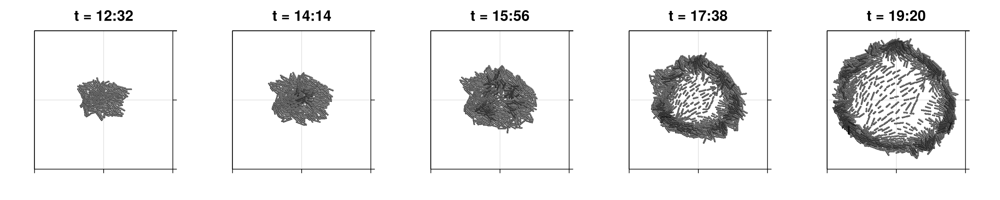

In [14]:
using JLD2

fig = Figure(size = (1500, 300))

file = jldopen("simulation_rescuePhrF.jld2", "r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

sort!(steps)

# escoger pasos
js = steps[60:10:end]
js=steps[[60,71,77,83,end-5]]
# js=steps[[60,71,77,83,end]]
js=steps[60:8:end-5]
for (i, j) in enumerate(js)

    params = file["step_$j"]

    t_hours = j / 1e4
    h = floor(Int, t_hours)
    m = floor(Int, (t_hours - h) * 60)


    ax = Axis3(fig[1, i],
        azimuth = 3π/2,
        elevation = π/2,
        zlabelvisible = false,
        xlabelvisible = false,
        ylabelvisible = false,
        zticklabelsvisible = false,
        xticklabelsvisible = false,
        yticklabelsvisible = false,
        zgridvisible = false,
        zspinesvisible = false,
        aspect = (1, 1, 0.5),
        title = "t = $(lpad(h,2,'0')):$(lpad(m,2,'0'))",
        titlesize = 22,
        titlegap = 10
    )

    plotAgents3D_auto!(
        ax,
        params["x"],
        params["y"],
        params["z"],
        params["d"],
        params["l"],
        params["theta"],
        params["phi"],
        params["z"],
        colormap = Reverse(:grays),
        colorrange = (-1, 2.5),
    )

    xlims!(ax, -50, 50)
    ylims!(ax, -50, 50)
    zlims!(ax, -10, 10)

end



# save("Pushing_z.png", fig; dpi = 1800*3)
# # save("Pushing_z.pdf", fig)
# save("Pushing_z.eps", fig) 
display(fig)

close(file)

In [16]:
save("Pushing_z_rescuePhrF.png", fig; dpi = 1800*3)

In [15]:
# using JLD2



# file = jldopen("simulation.jld2", "r")

# # obtener pasos guardados
# steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

# sort!(steps)

# # escoger pasos
# js = steps[60:10:end]
# js=steps[[50, 60,71,77,83,end-15, end-5, end]]
# # js=steps[[50,   end]]

# j=steps[end]
# params = file["step_$j"]
# max_xy = maximum(vcat(params["x"], params["y"]))
# min_xy = minimum(vcat(params["x"], params["y"]))

# lim = max(abs(min_xy), abs(max_xy)) + 5
# # js=steps[[1, 4]]

# for (i, j) in enumerate(js)
#     fig = Figure(size = (1200, 1200))
#     # j=steps[end-5]
#     params = file["step_$j"]

#     t_hours = j / 1e4
#     h = floor(Int, t_hours)
#     m = floor(Int, (t_hours - h) * 60)


#     ax = Axis3(fig[1, 1],
#         azimuth = 3π/2,
#         elevation = π/2,
#         zlabelvisible = false,
#         xlabelvisible = false,
#         ylabelvisible = false,
#         zticklabelsvisible = false,
#         xticklabelsvisible = false,
#         yticklabelsvisible = false,
#         zgridvisible = false,
#         zspinesvisible = false,
#         # xspinesvisible = false,
#         # yspinesvisible = false,
#         aspect = (1, 1, 0.5),
#         # title = "t = $(lpad(h,2,'0')):$(lpad(m,2,'0'))",
#         # titlesize = 22,
#         # titlegap = 10
#     )
#     hidespines!(ax)
#     hidedecorations!(ax)
#     plotAgents3D_auto!(
#         ax,
#         params["x"],
#         params["y"],
#         params["z"],
#         params["d"],
#         params["l"],
#         params["theta"],
#         params["phi"],
#         params["z"],
#         colormap = Reverse(:grays),
#         colorrange = (-1, 2.5),
#     )

    

#     x1, y1 = -lim + 5, -lim + 5
#     x2, y2 = -lim + 15, -lim + 5
#     # z = 0  # o el que estés usando en zlims
#     lines!(ax,
#         [x1, x2],
#         [y1, y2],
#         # [z, z],
#         linewidth = 4,
#         color = :black
#     )

#     xlims!(ax, -lim, lim)
#     ylims!(ax, -lim, lim)
#     zlims!(ax, -10, 10)
#     # end



#     save("Figures/Pushing_z_$(lpad(h,2,'0'))h_$(lpad(m,2,'0'))mim.png", fig; dpi = 1800*3)
#     # # save("Pushing_z.pdf", fig)
#     # save("Pushing_z.eps", fig) 
#     display(fig)
# end

# close(file)

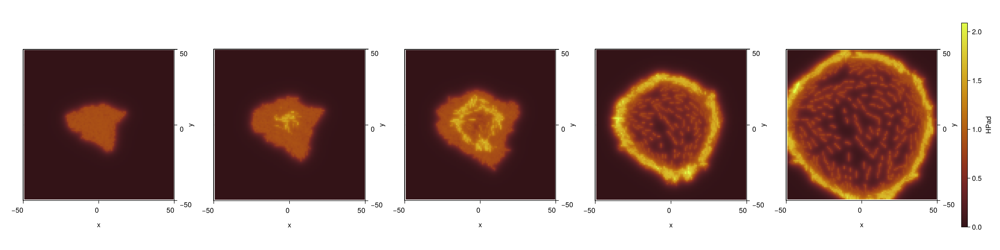

CairoMakie.Screen{IMAGE}


In [16]:
# com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))
colorrange_c = (0.0,  maximum(com.HPad))

fig = Figure(size=(2000,500))
file = jldopen("simulation.jld2", "r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

sort!(steps)

# escoger pasos
js = steps[60:10:end]
js=steps[60:8:end-5]
# js = round.(Int, range(1, length(com_load), length=5))

for (i,j) in enumerate(js)
    params = file["step_$j"]
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.HPad)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.HPad)[2]),
            Float64.((params["HPad"][:,:,1])),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "HPad"
)
display(fig)

In [17]:
maximum(com.HPad)

2.088931824902745

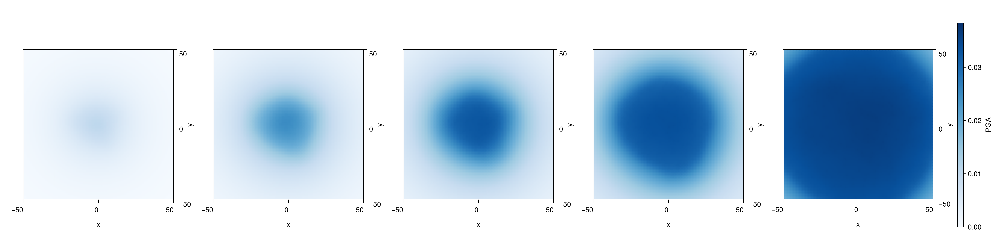

CairoMakie.Screen{IMAGE}


In [22]:
# com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:Blues
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:H]), com_load)))
# colorrange_c = (0.0,  maximum(com.PGA))
PGAmax = maximum([
    maximum(filter(isfinite, vec(file["step_$j"]["PGA"][:,:,1])))
    for j in js
])

colorrange_c = (0.0, PGAmax)
fig = Figure(size=(2000,500))
file = jldopen("simulation.jld2", "r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

sort!(steps)

# escoger pasos
js = steps[60:10:end]
js=steps[60:8:end-5]
js=steps[[60,71,77,83,end-5]]
# js = round.(Int, range(1, length(com_load), length=5))

for (i,j) in enumerate(js)
    params = file["step_$j"]
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PGA)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PGA)[2]),
            Float64.((params["PGA"][:,:,1])),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PGA"
)
display(fig)

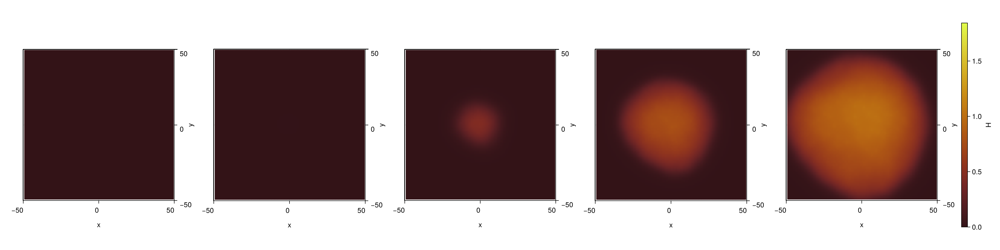

CairoMakie.Screen{IMAGE}


In [19]:
# com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:H]), com_load)))

# colorrange_c = (0.0,  maximum(com.H))
Hmax = maximum(filter(isfinite, vec(com.H)))
colorrange_c = (0.0, Hmax)

fig = Figure(size=(2000,500))
file = jldopen("simulation.jld2", "r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

sort!(steps)

# escoger pasos
js = steps[60:10:end]
js=steps[60:8:end-5]
# js = round.(Int, range(1, length(com_load), length=5))

for (i,j) in enumerate(js)
    params = file["step_$j"]
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.H)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.H)[2]),
            Float64.((params["H"][:,:,1])),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "H"
)
display(fig)

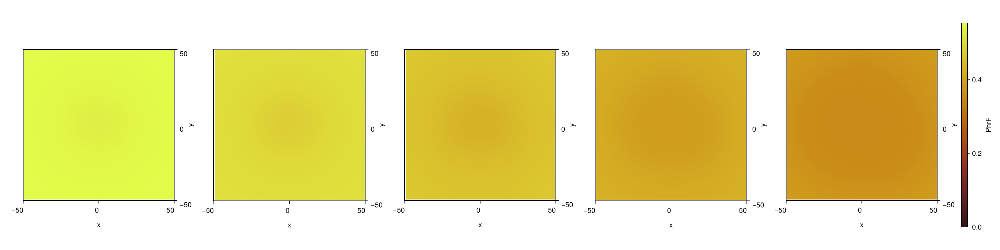

CairoMakie.Screen{IMAGE}


In [19]:
# com_load,times=load_parameters_log(file)
simBox_cpu = Array(com.simBox)  # copia a CPU

# cmap_transp_orange = cgrad(
#     [RGBAf(1.0, 0.55, 0, 0.0),   # verde con alfa 0 (transparente)
#      RGBAf(1.0, 0.55, 0, 1.0)],  # verde con alfa 1 (opaco)proves
#     506
# )

# colormap_c=cmap_transp_orange
colormap_c=:solar
# colorrange_c = (0.0,  maximum(maximum(p -> maximum(p[:PGA]), com_load)))

fig = Figure(size=(2000,500))
file = jldopen("simulation_rescuePhrF.jld2", "r")
PhrFmax = maximum([
    maximum(filter(isfinite, vec(file["step_$j"]["PhrF"][:,:,1])))
    for j in js
])
colorrange_c = (0.0,  PhrFmax)

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))

sort!(steps)

# escoger pasos
js = steps[60:10:end]
js=steps[60:8:end-5]
# js = round.(Int, range(1, length(com_load), length=5))

for (i,j) in enumerate(js)
    params = file["step_$j"]
    ax = Axis3(fig[1,i],
                azimuth=3*π/2,
                elevation=π/2,
                zlabelvisible=false,
                zticklabelsvisible=false,
                zgridvisible=false,
                zspinesvisible=false
            )

    # plotAgents2D!(
    # ax,
    # com_load[j][:x],
    # com_load[j][:y],
    # com_load[j][:d],
    # com_load[j][:l],
    # com_load[j][:theta],
    # com_load[j][:Vm],
    # colormap = Reverse(:inferno),
    # colorrange =  (-280, -120),
    # )

    m2 = heatmap!(ax,
            range(simBox_cpu[1,1],simBox_cpu[1,2],length=size(com.PhrF)[1]),
            range(simBox_cpu[2,1],simBox_cpu[2,2],length=size(com.PhrF)[2]),
            Float64.((params["PhrF"][:,:,1])),
            colormap = colormap_c,
            colorrange = colorrange_c
        )

    xlims!(-50,50)
    ylims!(-50,50)
end
Colorbar(fig[1, length(js) + 1],
    colormap = colormap_c,
    colorrange = colorrange_c,
    label = "PhrF"
)
display(fig)

In [ ]:
  com.HPad[50:150,100, 1]   

101-element Vector{Float64}:
 0.7099822713941601
 0.7723609670493762
 0.7696901314912596
 0.6508015880797907
 0.6154636520108784
 0.6439998675891075
 0.7669627135312671
 0.7548641786517646
 0.706831941235466
 0.6545483505120634
 ⋮
 0.8019134369908361
 0.8122041019990908
 0.7870839435885336
 0.7435973312363408
 0.6958277801699306
 0.7530225784402709
 0.8755424808573048
 1.0377707161202618
 1.4336781852566411

In [43]:
using Images, ImageMorphology


In [6]:


# ============================
function fill_holes(mask::BitMatrix)
    bg  = .!mask                    # fondo
    lbl = label_components(bg)      # etiquetas de fondo

    ny, nx = size(mask)
    border_labels = Set{Int}()

    # etiquetas de fondo que tocan el borde de la imagen
    union!(border_labels, lbl[1, :])
    union!(border_labels, lbl[end, :])
    union!(border_labels, lbl[:, 1])
    union!(border_labels, lbl[:, end])

    filled = copy(mask)

    @inbounds for i in 1:ny, j in 1:nx
        lab = lbl[i, j]
        if lab != 0 && !(lab in border_labels)
            filled[i, j] = true
        end
    end

    return filled
end

# ===============================
# Suavizado circular
# ===============================

function smooth_circular(x, w)

    n = length(x)
    y = similar(x)

    hw = div(w,2)

    for i in 1:n

        s = 0.0
        c = 0

        for k in -hw:hw
            j = mod1(i+k, n)
            s += x[j]
            c += 1
        end

        y[i] = s/c

    end

    return y

end


# ===============================
# Perímetro + centroide + CV
# ===============================

function colony_perimeter_centroid_cv(frame; px=0.5, bounds=nothing,
                                      cell_diam=1.0, sample_step=0.2,
                                      smooth_window=20)

    # compatible con Dict o JLD2.Group
    getf(frame,k) = try frame[k] catch; frame[Symbol(k)] end

    xs = getf(frame,"x")
    ys = getf(frame,"y")
    ls = getf(frame,"l")
    ts = getf(frame,"theta")
    ps = getf(frame,"phi")

    # ===============================
    # límites
    # ===============================

    if bounds === nothing

        xmin = minimum(xs); xmax = maximum(xs)
        ymin = minimum(ys); ymax = maximum(ys)

        pad = max(3px,3.0)

        xmin -= pad
        xmax += pad
        ymin -= pad
        ymax += pad

    else

        xmin,xmax,ymin,ymax = bounds

    end

    nx = Int(cld(xmax-xmin,px))
    ny = Int(cld(ymax-ymin,px))

    # ===============================
    # rasterización
    # ===============================

    mask = falses(ny,nx)

    Δs = sample_step * px

    for (x0,y0,l,θ,φ) in zip(xs,ys,ls,ts,ps)

        ux = cos(θ)*cos(φ)
        uy = sin(θ)*cos(φ)

        K = max(2,ceil(Int,l/Δs))

        @inbounds for s in LinRange(-l/2,l/2,K)

            xp = x0 + s*ux
            yp = y0 + s*uy

            j = clamp(Int(floor((xp-xmin)/px))+1,1,nx)
            i = clamp(Int(floor((yp-ymin)/px))+1,1,ny)

            mask[i,j] = true

        end

    end

    # ===============================
    # morfología
    # ===============================

    rpx = max(1,Int(round((cell_diam/2)/px)))

    K = trues(2rpx+1,2rpx+1)

    dil  = dilate(mask,K)
    clos = erode(dil,K)

    clos_filled = fill_holes(clos)

    perim = clos_filled .& .!erode(clos_filled,trues(3,3))

    # ===============================
    # centroide
    # ===============================

    Iarea = findall(clos_filled)

    @assert !isempty(Iarea) "Máscara vacía; revisa px/bounds/cell_diam."

    x_area = xmin .+ ((getindex.(Iarea,2).-1).*px)
    y_area = ymin .+ ((getindex.(Iarea,1).-1).*px)

    cx = mean(x_area)
    cy = mean(y_area)

    # ===============================
    # perímetro
    # ===============================

    Iper = findall(perim)

    @assert !isempty(Iper) "Perímetro vacío; revisa px/bounds/cell_diam."

    perim_x = xmin .+ ((getindex.(Iper,2).-1).*px)
    perim_y = ymin .+ ((getindex.(Iper,1).-1).*px)

    θ = atan.(perim_y .- cy, perim_x .- cx)

    ord = sortperm(θ)

    perim_x = perim_x[ord]
    perim_y = perim_y[ord]
    θ = θ[ord]

    # ===============================
    # 🔹 suavizado radial
    # ===============================

    r = hypot.(perim_x .- cx, perim_y .- cy)

    r_s = smooth_circular(r, smooth_window)

    perim_x = cx .+ r_s .* cos.(θ)
    perim_y = cy .+ r_s .* sin.(θ)

    # ===============================
    # CV radial
    # ===============================

    d = hypot.(perim_x .- cx, perim_y .- cy)

    μ = mean(d)
    σ = std(d)

    cv = σ/μ

    # ===============================
    # área y densidad
    # ===============================

    # ===============================
    # área, densidad y ocupación
    # ===============================

    area_px = count(clos_filled)
    area_um2 = area_px * px^2

    occupied_inside = clos .& clos_filled
    occupied_px = count(occupied_inside)

    area_px = count(clos_filled)

    fill_fraction = occupied_px / area_px
    empty_fraction = 1 - fill_fraction

    N = length(xs)
    density = N / area_um2

    return (perim_x=perim_x, perim_y=perim_y,
            cx=cx, cy=cy, cv=cv, mu=μ, sigma=σ,
            mask=mask, dil=dil, clos=clos, clos_filled=clos_filled, perim=perim,
            bounds=(xmin,xmax,ymin,ymax), px=px,
            area_px=area_px, area_um2=area_um2,
            occupied_px=occupied_px,
            fill_fraction=fill_fraction, empty_fraction=empty_fraction,
            N=N, density=density)

end

colony_perimeter_centroid_cv (generic function with 1 method)

In [35]:
# using CairoMakie

# parula = cgrad([
#     RGBf(0.2081,0.1663,0.5292),
#     RGBf(0.2116,0.1898,0.5777),
#     RGBf(0.2123,0.2138,0.6270),
#     RGBf(0.2081,0.2386,0.6771),
#     RGBf(0.1959,0.2645,0.7279),
#     RGBf(0.1707,0.2919,0.7792),
#     RGBf(0.1253,0.3242,0.8303),
#     RGBf(0.0591,0.3598,0.8683),
#     RGBf(0.0117,0.3875,0.8820),
#     RGBf(0.0060,0.4086,0.8828),
#     RGBf(0.0165,0.4266,0.8786),
#     RGBf(0.0329,0.4430,0.8720),
#     RGBf(0.0498,0.4586,0.8641),
#     RGBf(0.0629,0.4737,0.8554),
#     RGBf(0.0723,0.4887,0.8467),
#     RGBf(0.0779,0.5040,0.8384),
#     RGBf(0.0793,0.5200,0.8312),
#     RGBf(0.0749,0.5375,0.8263),
#     RGBf(0.0641,0.5570,0.8240),
#     RGBf(0.0488,0.5772,0.8228),
#     RGBf(0.0343,0.5966,0.8199),
#     RGBf(0.0265,0.6137,0.8135),
#     RGBf(0.0239,0.6287,0.8038),
#     RGBf(0.0231,0.6418,0.7913),
#     RGBf(0.0228,0.6535,0.7768),
#     RGBf(0.0267,0.6642,0.7607),
#     RGBf(0.0384,0.6743,0.7436),
#     RGBf(0.0590,0.6838,0.7254),
#     RGBf(0.0843,0.6928,0.7062),
#     RGBf(0.1133,0.7015,0.6859),
#     RGBf(0.1453,0.7098,0.6646),
#     RGBf(0.1801,0.7177,0.6424),
#     RGBf(0.2178,0.7250,0.6193),
#     RGBf(0.2586,0.7317,0.5954),
#     RGBf(0.3022,0.7376,0.5712),
#     RGBf(0.3482,0.7424,0.5473),
#     RGBf(0.3953,0.7459,0.5244),
#     RGBf(0.4420,0.7481,0.5033),
#     RGBf(0.4871,0.7491,0.4840),
#     RGBf(0.5300,0.7491,0.4661),
#     RGBf(0.5709,0.7485,0.4494),
#     RGBf(0.6099,0.7473,0.4337),
#     RGBf(0.6473,0.7456,0.4188),
#     RGBf(0.6834,0.7435,0.4044),
#     RGBf(0.7184,0.7411,0.3905),
#     RGBf(0.7525,0.7384,0.3768),
#     RGBf(0.7858,0.7356,0.3633),
#     # RGBf(0.8185,0.7327,0.3498),
#     # RGBf(0.8507,0.7299,0.3360),
#     # RGBf(0.8824,0.7274,0.3217),
#     # RGBf(0.9139,0.7258,0.3063),
#     # RGBf(0.9450,0.7261,0.2886),
#     # RGBf(0.9739,0.7314,0.2666),
#     # RGBf(0.9938,0.7455,0.2403),
#     # RGBf(0.9990,0.7653,0.2164),
#     # RGBf(0.9955,0.7861,0.1967),
#     # RGBf(0.9880,0.8066,0.1794),
#     # RGBf(0.9789,0.8271,0.1633),
#     # RGBf(0.9697,0.8481,0.1475),
#     # RGBf(0.9626,0.8705,0.1309),
#     # RGBf(0.9589,0.8949,0.1132),
#     # RGBf(0.9598,0.9218,0.0948),
#     # RGBf(0.9661,0.9514,0.0755),
#     # RGBf(0.9763,0.9831,0.0538)
# ])

In [7]:
using CairoMakie

parula = cgrad([
    RGBf(0.6297, 0.7859, 0.2521),
    RGBf(0.6161, 0.7878, 0.2622),
    RGBf(0.6024, 0.7896, 0.2726),
    RGBf(0.5886, 0.7913, 0.2833),
    RGBf(0.5748, 0.7929, 0.2941),
    RGBf(0.5609, 0.7943, 0.3050),
    RGBf(0.5470, 0.7957, 0.3159),
    RGBf(0.5329, 0.7970, 0.3267),
    RGBf(0.5187, 0.7982, 0.3374),
    RGBf(0.5044, 0.7993, 0.3480),
    RGBf(0.4899, 0.8002, 0.3586),
    RGBf(0.4753, 0.8011, 0.3691),
    RGBf(0.4608, 0.8018, 0.3797),
    RGBf(0.4463, 0.8024, 0.3904),
    RGBf(0.4322, 0.8028, 0.4013),
    RGBf(0.4184, 0.8030, 0.4122),
    RGBf(0.4050, 0.8031, 0.4233),
    RGBf(0.3921, 0.8029, 0.4344),
    RGBf(0.3795, 0.8026, 0.4454),
    RGBf(0.3671, 0.8021, 0.4563),
    RGBf(0.3548, 0.8016, 0.4669),
    RGBf(0.3424, 0.8009, 0.4774),
    RGBf(0.3301, 0.8002, 0.4876),
    RGBf(0.3176, 0.7994, 0.4975),
    RGBf(0.3052, 0.7985, 0.5074),
    RGBf(0.2929, 0.7975, 0.5170),
    RGBf(0.2809, 0.7964, 0.5266),
    RGBf(0.2695, 0.7951, 0.5360),
    RGBf(0.2589, 0.7937, 0.5454),
    RGBf(0.2491, 0.7922, 0.5546),
    RGBf(0.2401, 0.7905, 0.5636),
    RGBf(0.2318, 0.7887, 0.5725),
    RGBf(0.2244, 0.7869, 0.5813),
    RGBf(0.2178, 0.7849, 0.5899),
    RGBf(0.2118, 0.7828, 0.5983),
    RGBf(0.2061, 0.7808, 0.6065),
    RGBf(0.2003, 0.7787, 0.6146),
    RGBf(0.1954, 0.7765, 0.6225),
    RGBf(0.1905, 0.7743, 0.6303),
    RGBf(0.1853, 0.7721, 0.6379),
    RGBf(0.1799, 0.7699, 0.6454),
    RGBf(0.1741, 0.7678, 0.6527),
    RGBf(0.1678, 0.7656, 0.6599),
    RGBf(0.1609, 0.7635, 0.6671),
    RGBf(0.1532, 0.7614, 0.6741),
    RGBf(0.1448, 0.7593, 0.6812),
    RGBf(0.1354, 0.7572, 0.6881),
    RGBf(0.1252, 0.7552, 0.6950),
    RGBf(0.1141, 0.7531, 0.7019),
    RGBf(0.1023, 0.7510, 0.7088),
    RGBf(0.0899, 0.7489, 0.7156),
    RGBf(0.0770, 0.7468, 0.7224),
    RGBf(0.0638, 0.7446, 0.7292),
    RGBf(0.0504, 0.7423, 0.7359),
    RGBf(0.0369, 0.7400, 0.7426),
    RGBf(0.0253, 0.7376, 0.7492),
    RGBf(0.0162, 0.7352, 0.7558),
    RGBf(0.0094, 0.7327, 0.7623),
    RGBf(0.0046, 0.7301, 0.7688),
    RGBf(0.0018, 0.7275, 0.7752),
    RGBf(0.0009, 0.7248, 0.7815),
    RGBf(0.0019, 0.7220, 0.7878),
    RGBf(0.0046, 0.7192, 0.7941),
    RGBf(0.0091, 0.7163, 0.8003),
    RGBf(0.0155, 0.7133, 0.8064),
    RGBf(0.0234, 0.7103, 0.8124),
    RGBf(0.0328, 0.7071, 0.8183),
    RGBf(0.0433, 0.7039, 0.8242),
    RGBf(0.0535, 0.7006, 0.8299),
    RGBf(0.0628, 0.6972, 0.8355),
    RGBf(0.0713, 0.6938, 0.8409),
    RGBf(0.0789, 0.6902, 0.8462),
    RGBf(0.0855, 0.6865, 0.8513),
    RGBf(0.0914, 0.6828, 0.8562),
    RGBf(0.0964, 0.6789, 0.8609),
    RGBf(0.1009, 0.6750, 0.8653),
    RGBf(0.1048, 0.6710, 0.8695),
    RGBf(0.1085, 0.6669, 0.8734),
    RGBf(0.1119, 0.6627, 0.8770),
    RGBf(0.1152, 0.6584, 0.8804),
    RGBf(0.1185, 0.6541, 0.8834),
    RGBf(0.1219, 0.6497, 0.8862),
    RGBf(0.1253, 0.6453, 0.8887),
    RGBf(0.1288, 0.6408, 0.8910),
    RGBf(0.1321, 0.6363, 0.8932),
    RGBf(0.1354, 0.6317, 0.8953),
    RGBf(0.1383, 0.6272, 0.8975),
    RGBf(0.1408, 0.6226, 0.8998),
    RGBf(0.1429, 0.6180, 0.9022),
    RGBf(0.1446, 0.6135, 0.9050),
    RGBf(0.1461, 0.6089, 0.9080),
    RGBf(0.1475, 0.6043, 0.9113),
    RGBf(0.1492, 0.5997, 0.9147),
    RGBf(0.1513, 0.5950, 0.9182),
    RGBf(0.1540, 0.5902, 0.9218),
    RGBf(0.1573, 0.5854, 0.9254),
    RGBf(0.1610, 0.5805, 0.9289),
    RGBf(0.1649, 0.5755, 0.9323),
    RGBf(0.1686, 0.5705, 0.9357),
    RGBf(0.1716, 0.5655, 0.9393),
    RGBf(0.1740, 0.5605, 0.9432),
    RGBf(0.1755, 0.5554, 0.9473),
    RGBf(0.1764, 0.5504, 0.9516),
    RGBf(0.1768, 0.5452, 0.9560),
    RGBf(0.1773, 0.5401, 0.9602),
    RGBf(0.1778, 0.5349, 0.9641),
    RGBf(0.1785, 0.5296, 0.9677),
    RGBf(0.1795, 0.5244, 0.9709),
    RGBf(0.1806, 0.5191, 0.9738),
    RGBf(0.1818, 0.5138, 0.9766),
    RGBf(0.1831, 0.5084, 0.9793),
    RGBf(0.1847, 0.5030, 0.9819),
    RGBf(0.1869, 0.4975, 0.9844),
    RGBf(0.1903, 0.4919, 0.9867),
    RGBf(0.1950, 0.4861, 0.9887),
    RGBf(0.2006, 0.4803, 0.9906),
    RGBf(0.2066, 0.4743, 0.9926),
    RGBf(0.2128, 0.4682, 0.9948),
    RGBf(0.2189, 0.4620, 0.9968),
    RGBf(0.2250, 0.4559, 0.9985),
    RGBf(0.2311, 0.4497, 0.9995),
    RGBf(0.2369, 0.4437, 0.9996),
    RGBf(0.2424, 0.4378, 0.9991),
    RGBf(0.2473, 0.4319, 0.9983),
    RGBf(0.2517, 0.4261, 0.9974),
    RGBf(0.2556, 0.4203, 0.9965),
    RGBf(0.2591, 0.4145, 0.9955),
    RGBf(0.2621, 0.4088, 0.9946),
    RGBf(0.2647, 0.4030, 0.9935),
    RGBf(0.2670, 0.3973, 0.9924),
    RGBf(0.2691, 0.3916, 0.9912),
    RGBf(0.2710, 0.3860, 0.9898),
    RGBf(0.2726, 0.3804, 0.9881),
    RGBf(0.2741, 0.3748, 0.9862),
    RGBf(0.2754, 0.3693, 0.9840),
    RGBf(0.2766, 0.3638, 0.9817),
    RGBf(0.2776, 0.3583, 0.9791),
    RGBf(0.2784, 0.3529, 0.9763),
    RGBf(0.2791, 0.3475, 0.9733),
    RGBf(0.2798, 0.3421, 0.9702),
    RGBf(0.2803, 0.3367, 0.9670),
    RGBf(0.2807, 0.3313, 0.9636),
    RGBf(0.2809, 0.3259, 0.9600),
    RGBf(0.2811, 0.3204, 0.9563),
    RGBf(0.2813, 0.3150, 0.9524),
    RGBf(0.2814, 0.3095, 0.9483),
    RGBf(0.2814, 0.3040, 0.9441),
    RGBf(0.2813, 0.2985, 0.9397),
    RGBf(0.2811, 0.2930, 0.9352),
    RGBf(0.2809, 0.2875, 0.9305),
    RGBf(0.2806, 0.2819, 0.9255),
    RGBf(0.2802, 0.2764, 0.9204),
    RGBf(0.2798, 0.2708, 0.9150),
    RGBf(0.2794, 0.2653, 0.9094),
    RGBf(0.2788, 0.2598, 0.9035),
    RGBf(0.2781, 0.2543, 0.8973),
    RGBf(0.2774, 0.2489, 0.8908),
    RGBf(0.2766, 0.2435, 0.8840),
    RGBf(0.2758, 0.2382, 0.8767),
    RGBf(0.2749, 0.2330, 0.8692),
    RGBf(0.2740, 0.2280, 0.8612),
    RGBf(0.2729, 0.2231, 0.8528),
    RGBf(0.2717, 0.2184, 0.8439),
    RGBf(0.2704, 0.2138, 0.8346),
    RGBf(0.2691, 0.2094, 0.8249),
    RGBf(0.2676, 0.2052, 0.8148),
    RGBf(0.2661, 0.2011, 0.8043),
    RGBf(0.2645, 0.1972, 0.7937),
    RGBf(0.2628, 0.1932, 0.7828),
    RGBf(0.2611, 0.1893, 0.7719),
    RGBf(0.2594, 0.1854, 0.7610),
    RGBf(0.2576, 0.1814, 0.7501),
    RGBf(0.2558, 0.1773, 0.7393),
    RGBf(0.2540, 0.1732, 0.7286),
    RGBf(0.2522, 0.1689, 0.7179),
    RGBf(0.2503, 0.1648, 0.7071),
    RGBf(0.2484, 0.1607, 0.6961),
    RGBf(0.2464, 0.1569, 0.6847),
    RGBf(0.2444, 0.1534, 0.6728),
    RGBf(0.2422, 0.1504, 0.6603)
])

In [37]:
# import Pkg; Pkg.add("Images")
# import Pkg; Pkg.add("ImageMorphology")

In [39]:
steps[76:5:end]

6-element Vector{Int64}:
 159375
 170000
 180625
 191250
 201875
 212500

In [40]:
file = jldopen("simulation.jld2","r")

# obtener pasos guardados
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
last_step = maximum(steps)

212500

In [41]:
js = steps[16:5:end-10]

16-element Vector{Int64}:
  31875
  42500
  53125
  63750
  74375
  85000
  95625
 106250
 116875
 127500
 138125
 148750
 159375
 170000
 180625
 191250

In [8]:
Pkg; Pkg.add([ "ImageMorphology"])

   Resolving package versions...
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Project.toml`
  No Changes to `C:\Users\julia\OneDrive\Escritorio\phd\Bacteria_ABM\ABM_CBM\Manifest.toml`


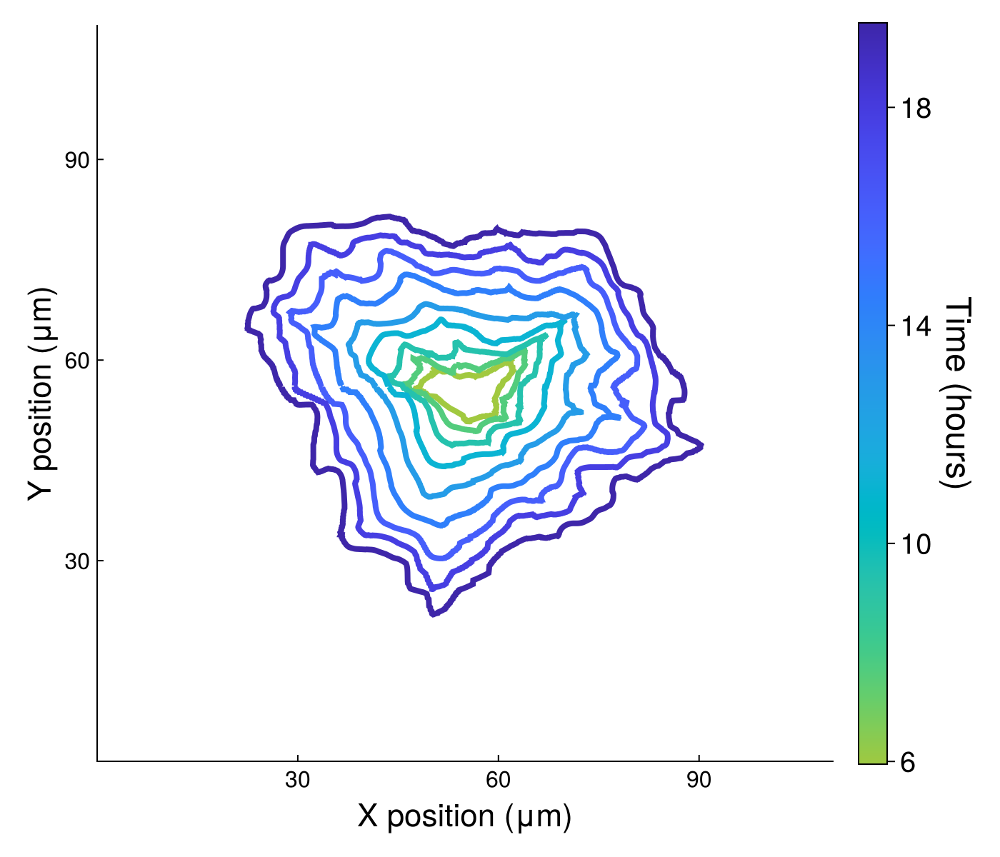

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\julia\.julia\packages\Makie\kJl0u\src\scenes.jl:264


CairoMakie.Screen{IMAGE}


In [12]:
using CairoMakie: Figure, Axis, Colorbar, scatterlines!, limits!, save
# using Images
using ImageMorphology
using JLD2




CairoMakie.activate!()

file = jldopen("simulationA2paper.jld2", "r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

js = steps[29:8:end-5]
# js= steps[30+2-8:4:end-2]
# js = js[: end-2]

cvs = Float64[]
densities = Float64[]
perims_x = Vector{Vector{Float64}}()
perims_y = Vector{Vector{Float64}}()

for step in js
    frame = file["step_$step"]

    res = colony_perimeter_centroid_cv(
        frame;
        px = 0.2,
        bounds = (-100, 100, -100, 100),
        cell_diam = 2.0,
        sample_step = 0.5,
        smooth_window = 20
    )

    push!(cvs, res.cv)
    push!(densities, res.density)
    push!(perims_x, res.perim_x)
    push!(perims_y, res.perim_y)
end

close(file)

cols = resample_cmap(parula, length(js))

fig1 = Figure(resolution = (700, 600))

ax1 = Axis(fig1[1, 1];
    xlabel = "X position (μm)",
    ylabel = "Y position (μm)",
    xlabelsize = 22,
    ylabelsize = 22,
    xticklabelsize = 16,
    yticklabelsize = 16,
    xgridvisible = false,
    ygridvisible = false,
    aspect = DataAspect(),
    xticks = [30, 60, 90],
    yticks = [30, 60, 90],
    xtickalign = 1,
    ytickalign = 1
)


hidespines!(ax1, :t, :r)

# trasladar las curvas para que queden en coordenadas positivas,
# parecido a la figura de referencia
xshift = 57
yshift = 55

for i in eachindex(js)
    scatterlines!(ax1, perims_x[i] .+ xshift, perims_y[i] .+ yshift;
        color = cols[i],
        linewidth = 4,
        markersize = 2
    )
end

limits!(ax1, 0, 110, 0, 110)

# ax1.xticks = 20:20:60
# ax1.yticks = 20:20:60

Colorbar(fig1[1, 2];
    colormap = parula,
    limits = (js[1] / 10000, js[end] / 10000),
    ticks = [6, 10, 14, 18],
    label = "Time (hours)",
    labelsize = 24,
    ticklabelsize = 20,
    labelrotation = -π/2,
    width = 20
)

save("Periphery_10V2.eps", fig1)
display(fig1)

In [6]:
steps[30+2-8:8:end-2]

UndefVarError: UndefVarError: `steps` not defined

In [97]:
js = steps[29:8:end-5]

9-element Vector{Int64}:
  59500
  76500
  93500
 110500
 127500
 144500
 161500
 178500
 195500

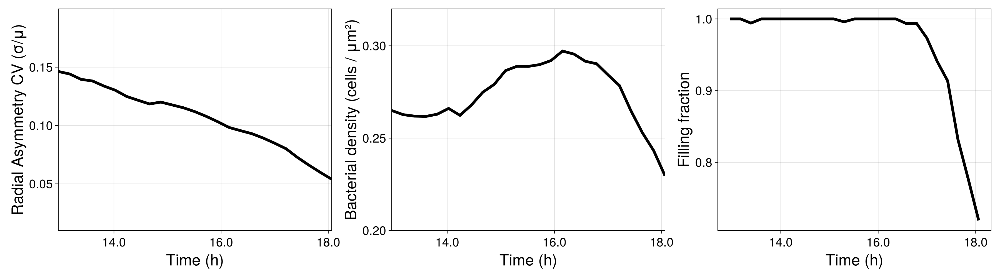

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\u256063\.julia\packages\Makie\kJl0u\src\scenes.jl:264


CairoMakie.Screen{IMAGE}


In [105]:
js = steps[62:end-15]

cvs = Float64[]
densities = Float64[]
fills = Float64[]

file = jldopen("simulationA2paper.jld2", "r")

for step in js
    frame = file["step_$step"]

    res = colony_perimeter_centroid_cv(
        frame;
        px = 0.2,
        bounds = (-100,100,-100,100),
        cell_diam = 2.0,
        sample_step = 0.5,
        smooth_window = 10
    )

    push!(cvs, res.cv)
    push!(densities, res.density)
    push!(fills, res.fill_fraction)
end

close(file)

fig2 = Figure(resolution = (1800, 500))  # más ancho 😉

ax2 = Axis(fig2[1, 1];
    xlabel = "Time (h)",
    ylabel = "Radial Asymmetry CV (σ/μ)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> [string(round(v / 1e4, digits=1)) for v in values]
)

ax3 = Axis(fig2[1, 2];
    xlabel = "Time (h)",
    ylabel = "Bacterial density (cells / μm²)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> [string(round(v / 1e4, digits=1)) for v in values]
)
ax4 = Axis(fig2[1, 3];
    xlabel = "Time (h)",
    ylabel = "Filling fraction",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> [string(round(v / 1e4, digits=1)) for v in values]
)
limits!(ax2, js[1] , js[end] ,0.01, 0.20)
limits!(ax3, js[1], js[end] , 0.20, 0.32)

lines!(ax2, js, cvs;
    color = :black,
    linewidth = 5
)

lines!(ax3, js, densities;
    color = :black,
    linewidth = 5,
)
lines!(ax4, js, fills;
    color = :black,
    linewidth = 5,
)

# save("NonPushing_ax2_ax3_black.svg", fig2)
display(fig2)

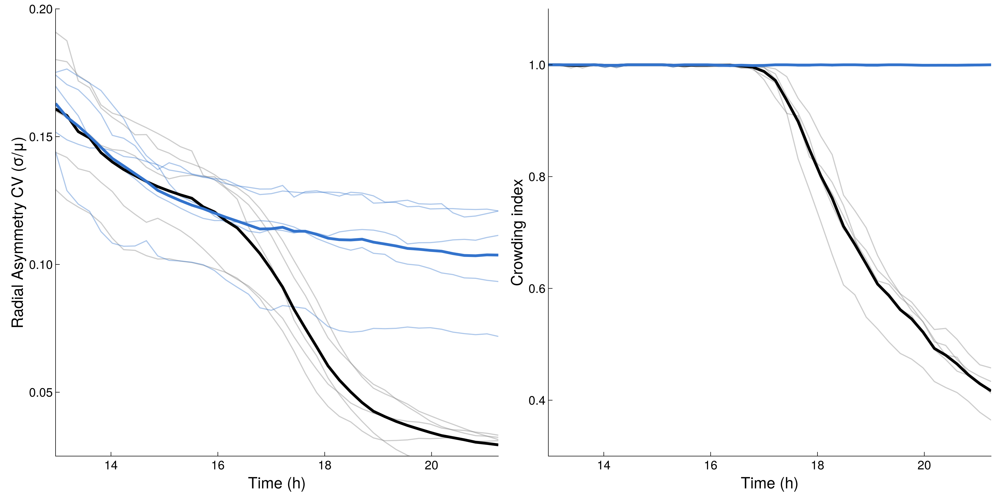

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\u256063\.julia\packages\Makie\kJl0u\src\scenes.jl:264


CairoMakie.Screen{EPS}


In [ ]:
using CairoMakie: Figure, Axis, limits!, save, lines!, hidespines!
using Images
using ImageMorphology
using JLD2
using Statistics

file = jldopen("simulation.jld2", "r")
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)
js = steps[62:end]
close(file)

files = [
    "simulationA2paper.jld2",
    "simulationA22.jld2",
    "simulationA23.jld2",
    "simulationA24.jld2",
    "simulationA25.jld2"
]

files_group2 = [
    "../nopushing/simulationA2paper.jld2",
    "../nopushing/simulationA22.jld2",
    "../nopushing/simulationA23.jld2",
    "../nopushing/simulationA24.jld2",
    "../nopushing/simulationA25.jld2"
]

nfiles = length(files)
nsteps = length(js)

# Matrices: filas = tiempo, columnas = archivo
all_cvs = fill(NaN, nsteps, nfiles)
all_densities = fill(NaN, nsteps, nfiles)
all_fills = fill(NaN, nsteps, nfiles)

for (k, filename) in enumerate(files)
    file = jldopen(filename, "r")

    cvs = Float64[]
    densities = Float64[]
    fills = Float64[]

    for step in js
        frame = file["step_$step"]

        res = colony_perimeter_centroid_cv(
            frame;
            px = 0.2,
            bounds = (-100, 100, -100, 100),
            cell_diam = 2.0,
            sample_step = 0.5,
            smooth_window = 20
        )

        push!(cvs, res.cv)
        push!(densities, res.density)
        push!(fills, res.fill_fraction)
    end

    close(file)

    all_cvs[:, k] .= cvs
    all_densities[:, k] .= densities
    all_fills[:, k] .= fills
end

# Media entre archivos grupo 1
mean_cvs = vec(mean(all_cvs, dims = 2))
mean_densities = vec(mean(all_densities, dims = 2))
mean_fills = vec(mean(all_fills, dims = 2))

nfiles2 = length(files_group2)

all_cvs2 = fill(NaN, nsteps, nfiles2)
all_densities2 = fill(NaN, nsteps, nfiles2)
all_fills2 = fill(NaN, nsteps, nfiles2)

for (k, filename) in enumerate(files_group2)
    file = jldopen(filename, "r")

    cvs = Float64[]
    densities = Float64[]
    fills = Float64[]

    for step in js
        frame = file["step_$step"]

        res = colony_perimeter_centroid_cv(
            frame;
            px = 0.2,
            bounds = (-100, 100, -100, 100),
            cell_diam = 2.0,
            sample_step = 0.5,
            smooth_window = 20
        )

        push!(cvs, res.cv)
        push!(densities, res.density)
        push!(fills, res.fill_fraction)
    end

    close(file)

    all_cvs2[:, k] .= cvs
    all_densities2[:, k] .= densities
    all_fills2[:, k] .= fills
end

# Media entre archivos grupo 2
mean_cvs2 = vec(mean(all_cvs2, dims = 2))
mean_densities2 = vec(mean(all_densities2, dims = 2))
mean_fills2 = vec(mean(all_fills2, dims = 2))

# =========================
# Figura
# =========================

fig2 = Figure(resolution = (1800, 900))

ax2 = Axis(fig2[1, 1];
    xlabel = "Time (h)",
    ylabel = "Radial Asymmetry CV (σ/μ)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> ["$(Int(round(v / 1e4)))" for v in values]
)

ax4 = Axis(fig2[1, 2];
    xlabel = "Time (h)",
    ylabel = "Crowding index",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> ["$(Int(round(v / 1e4)))" for v in values]
)

# Estilo de ejes
ax2.xgridvisible = false
ax2.ygridvisible = false
ax4.xgridvisible = false
ax4.ygridvisible = false

hidespines!(ax2, :t, :r)
hidespines!(ax4, :t, :r)

ax2.xtickalign = 1
ax2.ytickalign = 1
ax4.xtickalign = 1
ax4.ytickalign = 1

ax2.xticksize = 8
ax2.yticksize = 8
ax4.xticksize = 8
ax4.yticksize = 8

# Límites
limits!(ax2, js[1], js[end], 0.025, 0.20)
limits!(ax4, js[1], js[end], 0.3, 1.1)

# Ticks manuales
ax2.yticks = [0.05, 0.1, 0.15, 0.2]
ax4.yticks = [0.4, 0.6, 0.8, 1.0]

xt = 1e4 .* [14, 16, 18, 20]
ax2.xticks = xt
ax4.xticks = xt

blue = RGBf(0.2, 0.45, 0.8)

# Simulaciones individuales grupo 1
for k in 1:nfiles
    lines!(ax2, js, all_cvs[:, k];
        color = (:gray, 0.4),
        linewidth = 2
    )

    lines!(ax4, js, all_fills[:, k];
        color = (:gray, 0.4),
        linewidth = 2
    )
end

# Simulaciones individuales grupo 2
for k in 1:nfiles2
    lines!(ax2, js, all_cvs2[:, k];
        color = (blue, 0.4),
        linewidth = 2
    )

    lines!(ax4, js, all_fills2[:, k];
        color = (blue, 0.4),
        linewidth = 2
    )
end

# Medias
lines!(ax2, js, mean_cvs;
    color = :black,
    linewidth = 5
)

lines!(ax4, js, mean_fills;
    color = :black,
    linewidth = 5
)

lines!(ax2, js, mean_cvs2;
    color = blue,
    linewidth = 5
)

lines!(ax4, js, mean_fills2;
    color = blue,
    linewidth = 5
)

display(fig2)
save("Figures/Crowding_RadialAsymmetry.eps", fig2)

┌ Warning: Found `resolution` in the theme when creating a `Scene`. The `resolution` keyword for `Scene`s and `Figure`s has been deprecated. Use `Figure(; size = ...` or `Scene(; size = ...)` instead, which better reflects that this is a unitless size and not a pixel resolution. The key could also come from `set_theme!` calls or related theming functions.
└ @ Makie C:\Users\u256063\.julia\packages\Makie\kJl0u\src\scenes.jl:264


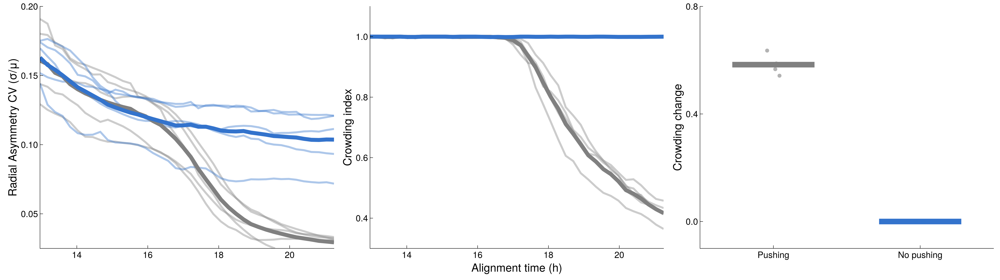

CairoMakie.Screen{EPS}


In [113]:
using CairoMakie: Figure, Axis, limits!, save, lines!, hidespines!, scatter!, segments!
using Images
using ImageMorphology
using JLD2
using Statistics
using Random

file = jldopen("simulation.jld2", "r")
steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)
js = steps[62:end]
close(file)

files = [
    "simulationA2paper.jld2",
    "simulationA22.jld2",
    "simulationA23.jld2",
    "simulationA24.jld2",
    "simulationA25.jld2"
]

files_group2 = [
    "../nopushing/simulationA2paper.jld2",
    "../nopushing/simulationA22.jld2",
    "../nopushing/simulationA23.jld2",
    "../nopushing/simulationA24.jld2",
    "../nopushing/simulationA25.jld2"
]

nfiles = length(files)
nsteps = length(js)

# Matrices: filas = tiempo, columnas = archivo
all_cvs = fill(NaN, nsteps, nfiles)
all_fills = fill(NaN, nsteps, nfiles)

for (k, filename) in enumerate(files)
    file = jldopen(filename, "r")

    cvs = Float64[]
    fills = Float64[]

    for step in js
        frame = file["step_$step"]

        res = colony_perimeter_centroid_cv(
            frame;
            px = 0.2,
            bounds = (-100, 100, -100, 100),
            cell_diam = 2.0,
            sample_step = 0.5,
            smooth_window = 20
        )

        push!(cvs, res.cv)
        push!(fills, res.fill_fraction)
    end

    close(file)

    all_cvs[:, k] .= cvs
    all_fills[:, k] .= fills
end

# Media entre archivos grupo 1
mean_cvs = vec(mean(all_cvs, dims = 2))
mean_fills = vec(mean(all_fills, dims = 2))

nfiles2 = length(files_group2)

all_cvs2 = fill(NaN, nsteps, nfiles2)
all_fills2 = fill(NaN, nsteps, nfiles2)

for (k, filename) in enumerate(files_group2)
    file = jldopen(filename, "r")

    cvs = Float64[]
    fills = Float64[]

    for step in js
        frame = file["step_$step"]

        res = colony_perimeter_centroid_cv(
            frame;
            px = 0.2,
            bounds = (-100, 100, -100, 100),
            cell_diam = 2.0,
            sample_step = 0.5,
            smooth_window = 20
        )

        push!(cvs, res.cv)
        push!(fills, res.fill_fraction)
    end

    close(file)

    all_cvs2[:, k] .= cvs
    all_fills2[:, k] .= fills
end

# Media entre archivos grupo 2
mean_cvs2 = vec(mean(all_cvs2, dims = 2))
mean_fills2 = vec(mean(all_fills2, dims = 2))

# =========================
# Crowding change
# =========================
# Opción tipo figura: cambio total en la ventana = final - inicial
crowding_change_1 = vec(all_fills[end, :] .- all_fills[1, :])
crowding_change_2 = vec(all_fills2[end, :] .- all_fills2[1, :])

mean_change_1 = mean(crowding_change_1)
mean_change_2 = mean(crowding_change_2)

# =========================
# Figura
# =========================

fig2 = Figure(resolution = (2500, 700))

ax2 = Axis(fig2[1, 1];
    ylabel = "Radial Asymmetry CV (σ/μ)",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> ["$(Int(round(v / 1e4)))" for v in values]
)

ax4 = Axis(fig2[1, 2];
    xlabel = "Alignment time (h)",
    ylabel = "Crowding index",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22,
    xtickformat = values -> ["$(Int(round(v / 1e4)))" for v in values]
)

ax5 = Axis(fig2[1, 3];
    ylabel = "Crowding change",
    xlabelsize = 28,
    ylabelsize = 28,
    xticklabelsize = 22,
    yticklabelsize = 22
)

# Estilo
for ax in (ax2, ax4, ax5)
    ax.xgridvisible = false
    ax.ygridvisible = false
    hidespines!(ax, :t, :r)
    ax.xtickalign = 1
    ax.ytickalign = 1
    ax.xticksize = 8
    ax.yticksize = 8
end

# Límites
limits!(ax2, js[1], js[end], 0.025, 0.20)
limits!(ax4, js[1], js[end], 0.3, 1.1)


limits!(ax5, 0.5, 2.5, -0.1,0.8)

# Ticks manuales
ax2.yticks = [0.05, 0.1, 0.15, 0.2]
ax4.yticks = [0.4, 0.6, 0.8, 1.0]
ax5.yticks = [0, 0.4, 0.8]

xt = 1e4 .* [14, 16, 18, 20]
ax2.xticks = xt
ax4.xticks = xt

blue = RGBf(0.2, 0.45, 0.8)
redish = RGBf(0.90, 0.40, 0.35)

# Panel 1: CV
for k in 1:nfiles
    lines!(ax2, js, all_cvs[:, k];
        color = (:gray, 0.4),
        linewidth = 5
    )
end

for k in 1:nfiles2
    lines!(ax2, js, all_cvs2[:, k];
        color = (blue, 0.4),
        linewidth = 5
    )
end

lines!(ax2, js, mean_cvs;
    color = :gray,
    linewidth = 10
)

lines!(ax2, js, mean_cvs2;
    color = blue,
    linewidth = 10
)

# Panel 2: crowding index
for k in 1:nfiles
    lines!(ax4, js, all_fills[:, k];
        color = (:gray, 0.4),
        linewidth = 5
    )
end

for k in 1:nfiles2
    lines!(ax4, js, all_fills2[:, k];
        color = (blue, 0.4),
        linewidth = 5
    )
end

lines!(ax4, js, mean_fills;
    color = :gray,
    linewidth = 10
)

lines!(ax4, js, mean_fills2;
    color = blue,
    linewidth = 10
)



# Panel 3: crowding change
Random.seed!(1)
jitter1 = 0.10 .* (rand(length(crowding_change_1)) .- 0.5)
jitter2 = 0.10 .* (rand(length(crowding_change_2)) .- 0.5)

x1 = 1 .+ jitter1
x2 = 2 .+ jitter2



# Barras de media
lines!(ax5, [0.72, 1.28], [-mean_change_1, -mean_change_1];
    color = :gray,
    linewidth = 14
)

lines!(ax5, [1.72, 2.28], [-mean_change_2, -mean_change_2];
    color = blue,
    linewidth = 14
)
scatter!(ax5, x1, -crowding_change_1;
    color = (:gray, 0.6),
    markersize = 14
)

scatter!(ax5, x2, -crowding_change_2;
    color = (blue, 0.6),
    markersize = 14
)
ax5.xticks = ([1, 2], ["Pushing", "No pushing"])

display(fig2)
save("Figures/Analysis_results.eps", fig2)

In [67]:
mean_fills2

40-element Vector{Float64}:
 0.19389410321837353
 0.19391284014131888
 0.1948026330503421
 0.19320285737586135
 0.1943850618354978
 0.19477129966772308
 0.1957725627965194
 0.1965404592167591
 0.19839764058284817
 0.20225011309235863
 ⋮
 0.24419288910702205
 0.24622378627804062
 0.24842027594447189
 0.2509243155362332
 0.2520861725022931
 0.2549101005997469
 0.25761191173865405
 0.2587337186288769
 0.25969690189204453

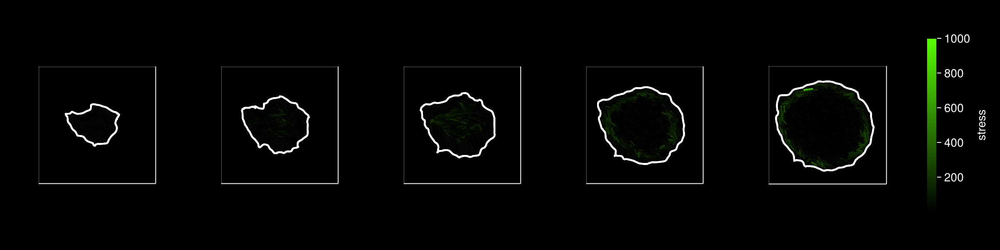

In [ ]:
using CairoMakie
using JLD2

CairoMakie.activate!()

fig = Figure(
    size = (1200, 300),
    backgroundcolor = :black
)

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

idx = steps[50:20:end]
idx=steps[[60,71,77,83,end-15]]
for (i, step) in enumerate(idx)

    frame = file["step_$step"]

    ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
    iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

    HP = frame["HPad"][CartesianIndex.(ix,iy)]

    stress = exp.(frame["gamma_c"] .* (HP .- frame["z"] .- frame["d"]/2))*10

    ax = Axis3(fig[1,i],
        azimuth = 3π/2,
        elevation = π/2,
        zlabelvisible = false,
        zticklabelsvisible = false,
        zgridvisible = false,
        zspinesvisible = false,
        aspect = (1,1,0.5),
        backgroundcolor = :black,
        xspinecolor_1 = :white,
        yspinecolor_1 = :white,
        xspinecolor_2 = :white,
        yspinecolor_2 = :white
    )

    plotAgents3D_auto!(
        ax,
        frame["x"],
        frame["y"],
        -frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        stress,
        colorrange = (1,1000),
        colormap = cgrad([:black, "#59FF00"]),
    )

    res = colony_perimeter_centroid_cv(
        frame;
        px = 0.2,
        bounds = (-100,100,-100,100),
        cell_diam = 2.5,
        sample_step = 0.01
    )

    scatterlines!(ax, res.perim_x, res.perim_y;
        color = :white,
        linewidth = 2,
        markersize = 3
    )

    xlims!(-40,40)
    ylims!(-40,40)
    zlims!(-10,10)
end

Colorbar(fig[1, length(idx)+1],
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,1000),
    label = "stress",
    labelcolor = :white,
    ticklabelcolor = :white,
    tickcolor = :white,
    # leftspinecolor = :white,
    # rightspinecolor = :white,
    # topspinecolor = :white,
    # bottomspinecolor = :white
)

# save("NonPushing_V.png", fig; dpi=1500)
display(fig)

close(file)

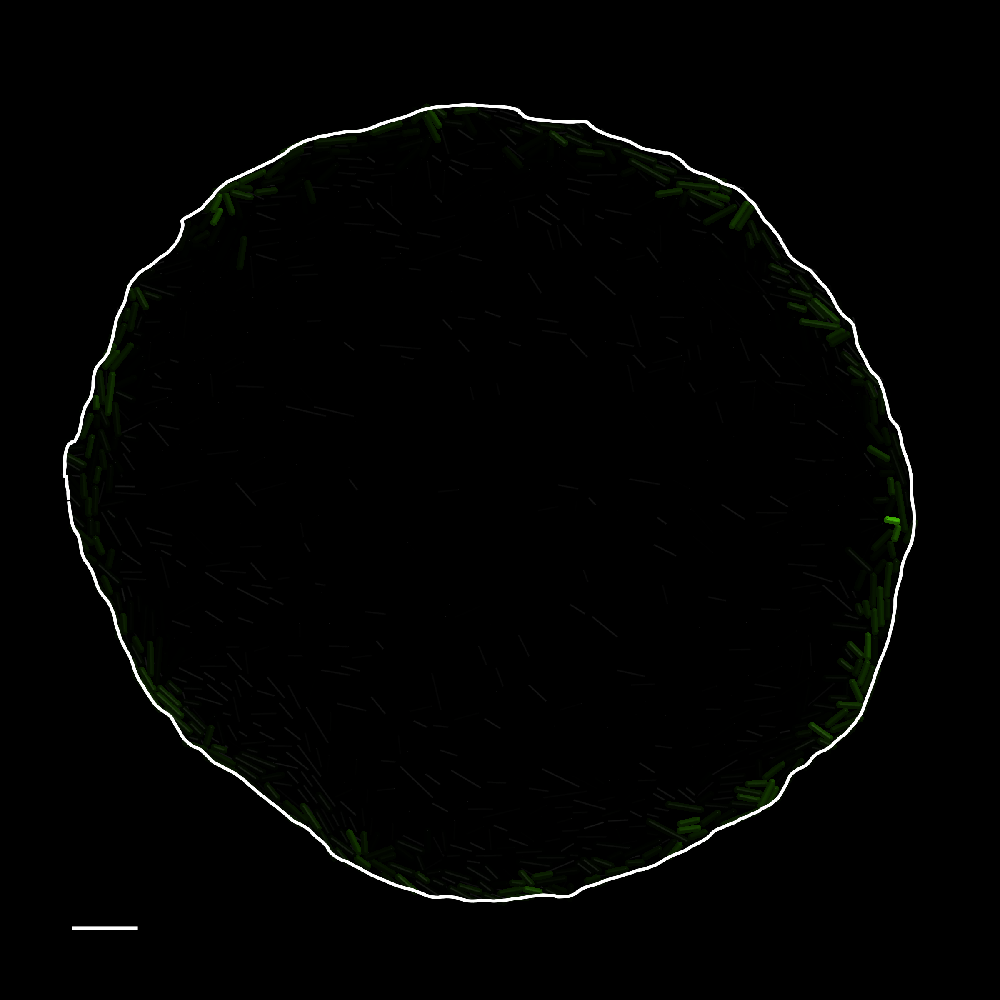

Stress range: 0.08898286858415566 - 748.4444274703861


In [10]:
using CairoMakie
using JLD2
using CairoMakie: Figure, Axis, Colorbar, scatterlines!, limits!, save
# using Images
using ImageMorphology
using JLD2

CairoMakie.activate!()

fig = Figure(
    size = (1200, 1200),
    backgroundcolor = :black
)

file = jldopen("simulationA2paper1.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

idx = steps[50:20:end]
idx=steps[[60,71,77,83,end-15]]
step=idx[end]
step = steps[end]
# for (i, step) in enumerate(idx)

frame = file["step_$step"]
t_hours = step / 1e4
h = floor(Int, t_hours)
m = floor(Int, (t_hours - h) * 60)

ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

HP = frame["HPad"][CartesianIndex.(ix,iy)]

stress = exp.(frame["gamma_c"] .* (HP .- frame["z"] .- frame["d"]/2))*10
println("Stress range: ", minimum(stress), " - ", maximum(stress))
ax = Axis3(fig[1,1],
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.5),
    backgroundcolor = :black,
    # xspinecolor_1 = :white,
    # yspinecolor_1 = :white,
    # xspinecolor_2 = :white,
    # yspinecolor_2 = :white
)

plotAgents3D_auto!(
    ax,
    frame["x"],
    frame["y"],
    -frame["z"],
    frame["d"],
    frame["l"],
    frame["theta"],
    frame["phi"],
    stress,
    colorrange = (1,1000),
    colormap = cgrad([:black, "#59FF00"]),
)

res = colony_perimeter_centroid_cv(
    frame;
    px = 0.2,
    bounds = (-100,100,-100,100),
    cell_diam = 2.5,
    sample_step = 0.01
)

lines!(ax, res.perim_x, res.perim_y;
    color = :white,
    linewidth = 4,
    # markersize = 3
)

max_xy = maximum(vcat(frame["x"], frame["y"]))
min_xy = minimum(vcat(frame["x"], frame["y"]))

lim = max(abs(min_xy), abs(max_xy)) + 5

x1, y1 = -lim + 5, -lim + 5
x2, y2 = -lim + 15, -lim + 5
# z = 0  # o el que estés usando en zlims
lines!(ax,
    [x1, x2],
    [y1, y2],
    # [z, z],
    linewidth = 4,
    color = :white
)

xlims!(ax, -lim, lim)
ylims!(ax, -lim, lim)
zlims!(ax, -10, 10)
# end

# end

# Colorbar(fig[1, 2],
#     colormap = cgrad([:black, "#59FF00"]),
#     colorrange = (1,1000),
#     label = "Death predictor",
#     labelcolor = :white,
#     ticklabelcolor = :white,
#     tickcolor = :white,
#     # leftspinecolor = :white,
#     # rightspinecolor = :white,
#     # topspinecolor = :white,
#     # bottomspinecolor = :white
# )

# save("NonPushing_V.png", fig; dpi=3000)
# save("NonPushing_V.eps", fig)
save("Death_$(lpad(h,2,'0'))h_$(lpad(m,2,'0'))mim.png", fig; dpi = 1800*3)
display(fig)

close(file)

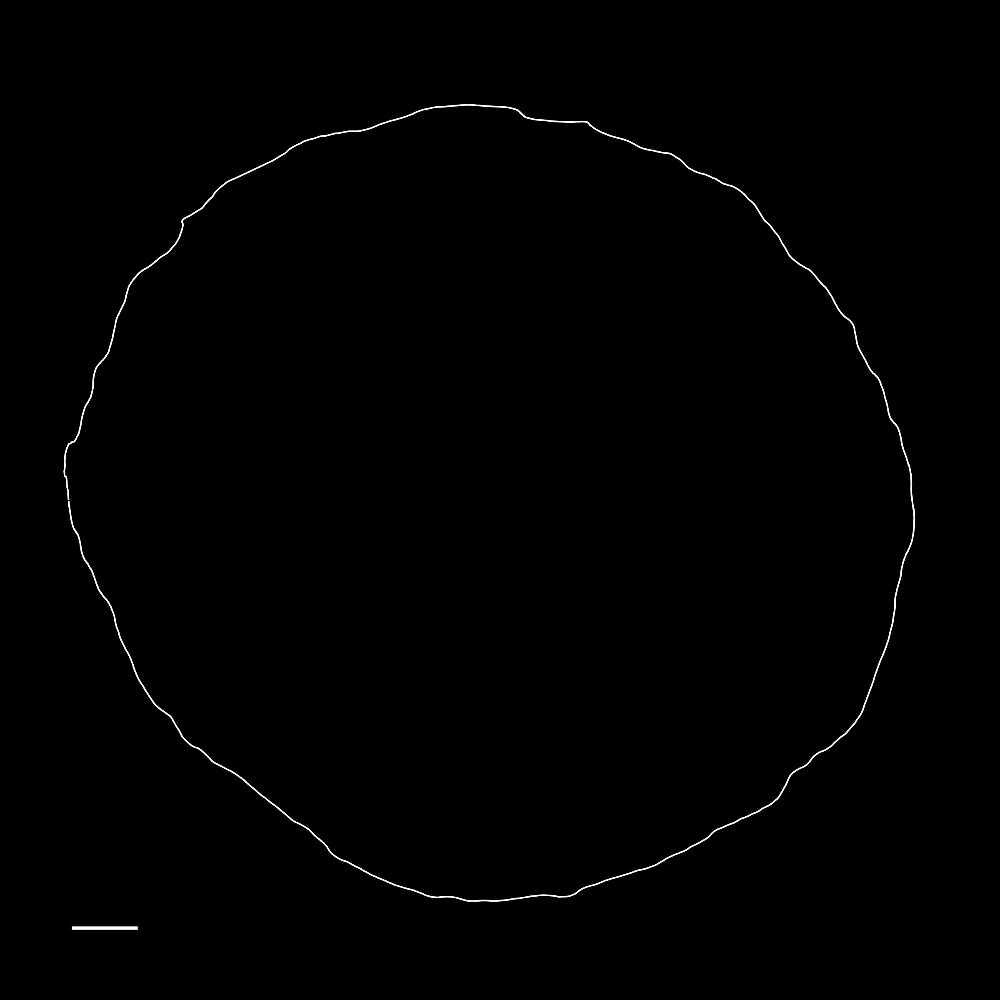

Stress range: 0.08898286858415566 - 748.4444274703861


In [79]:
using CairoMakie
using JLD2

CairoMakie.activate!()

fig = Figure(
    size = (1200, 1200),
    backgroundcolor = :black
)

file = jldopen("simulationA2paper.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

idx = steps[50:20:end]
idx=steps[[60,71,77,83,end-15]]
step=idx[end]
step = steps[end]
# for (i, step) in enumerate(idx)

frame = file["step_$step"]

ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

HP = frame["HPad"][CartesianIndex.(ix,iy)]

stress = exp.(frame["gamma_c"] .* (HP .- frame["z"] .- frame["d"]/2))*10
println("Stress range: ", minimum(stress), " - ", maximum(stress))
ax = Axis3(fig[1,1],
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.5),
    backgroundcolor = :black,
    # xspinecolor_1 = :white,
    # yspinecolor_1 = :white,
    # xspinecolor_2 = :white,
    # yspinecolor_2 = :white
)

# plotAgents3D_auto!(
#     ax,
#     frame["x"],
#     frame["y"],
#     -frame["z"],
#     frame["d"],
#     frame["l"],
#     frame["theta"],
#     frame["phi"],
#     stress,
#     colorrange = (1,1000),
#     colormap = cgrad([:black, "#59FF00"]),
# )

res = colony_perimeter_centroid_cv(
    frame;
    px = 0.2,
    bounds = (-100,100,-100,100),
    cell_diam = 2.5,
    sample_step = 0.01
)

lines!(ax, res.perim_x, res.perim_y;
    color = :white,
    linewidth = 2,
    # markersize = 3
)

max_xy = maximum(vcat(params["x"], params["y"]))
min_xy = minimum(vcat(params["x"], params["y"]))

lim = max(abs(min_xy), abs(max_xy)) + 5

x1, y1 = -lim + 5, -lim + 5
x2, y2 = -lim + 15, -lim + 5
# z = 0  # o el que estés usando en zlims
lines!(ax,
    [x1, x2],
    [y1, y2],
    # [z, z],
    linewidth = 4,
    color = :white
)

xlims!(ax, -lim, lim)
ylims!(ax, -lim, lim)
zlims!(ax, -10, 10)
# end

# end

# Colorbar(fig[1, 2],
#     colormap = cgrad([:black, "#59FF00"]),
#     colorrange = (1,1000),
#     label = "Death predictor",
#     labelcolor = :white,
#     ticklabelcolor = :white,
#     tickcolor = :white,
#     # leftspinecolor = :white,
#     # rightspinecolor = :white,
#     # topspinecolor = :white,
#     # bottomspinecolor = :white
# )

# save("NonPushing_V.png", fig; dpi=3000)
# save("NonPushing_V.eps", fig)
save("Figures/Death_perimeter_$(lpad(h,2,'0'))h_$(lpad(m,2,'0'))mim.eps", fig)
display(fig)

close(file)

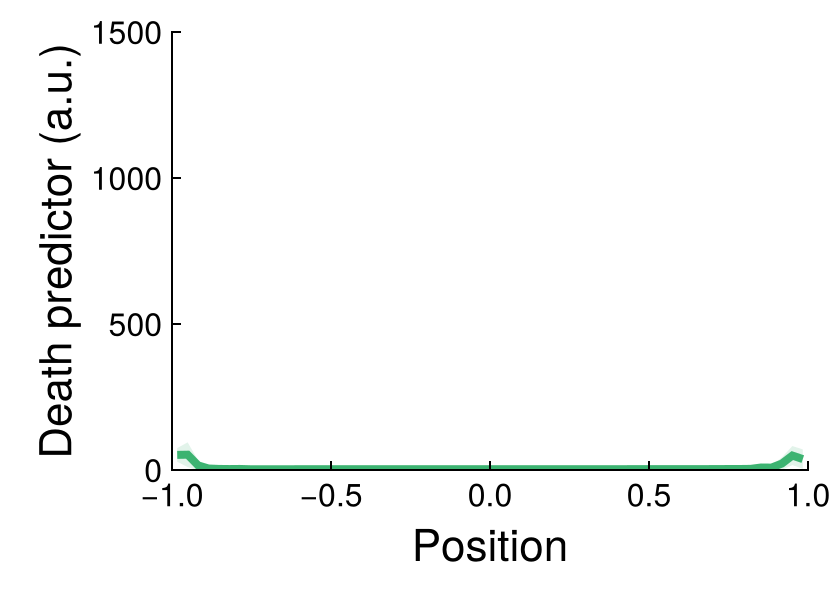

In [13]:
using CairoMakie: Figure, Axis, Colorbar, scatterlines!, limits!, save
using Images
using ImageMorphology
using JLD2
using Statistics

CairoMakie.activate!()

file = jldopen("simulationA2paper.jld2", "r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

step = steps[end]
frame = file["step_$step"]

# ===============================
# centroide
# ===============================
res = colony_perimeter_centroid_cv(
    frame;
    px = 0.2,
    bounds = (-100, 100, -100, 100),
    cell_diam = 2.5,
    sample_step = 0.01,
    smooth_window = 20
)

cx, cy = res.cx, res.cy

# ===============================
# stress por bacteria
# ===============================
ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"], 2))
iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"], 1))

HP = frame["HPad"][CartesianIndex.(ix, iy)]
stress = exp.(frame["gamma_c"] .* (HP .- frame["z"] .- frame["d"] ./ 2))*10

x = frame["x"] .- cx
y = frame["y"] .- cy

# ===============================
# función: perfil sobre una recta
# ===============================
function line_profile_angle(x, y, stress, θ;
    band_halfwidth = 2.5,
    nbins = 61,
    min_count_bin = 3,
    min_count_angle = 30
)

    ux = cos(θ)
    uy = sin(θ)

    s = x .* ux .+ y .* uy
    p = -x .* uy .+ y .* ux

    sel = abs.(p) .<= band_halfwidth

    if count(sel) < min_count_angle
        return nothing
    end

    s_sel = s[sel]
    stress_sel = stress[sel]

    smin = minimum(s_sel)
    smax = maximum(s_sel)

    if smax <= smin
        return nothing
    end

    snorm = 2 .* ((s_sel .- smin) ./ (smax - smin)) .- 1

    edges = range(-1, 1, length = nbins + 1)
    centers_local = 0.5 .* (edges[1:end-1] .+ edges[2:end])

    prof = fill(NaN, nbins)
    cnts = zeros(Int, nbins)

    for i in 1:nbins
        m = (snorm .>= edges[i]) .& (snorm .< edges[i+1])
        cnts[i] = count(m)
        if cnts[i] >= min_count_bin
            prof[i] = mean(stress_sel[m])
        end
    end

    return centers_local, prof, cnts
end

# ===============================
# integrar sobre ángulos
# ===============================
nangles = 80
angles = range(0, π, length = nangles)

nbins = 61
edges = range(-1, 1, length = nbins + 1)
centers = 0.5 .* (edges[1:end-1] .+ edges[2:end])

all_profiles = Matrix{Float64}(undef, nbins, 0)

for θ in angles
    out = line_profile_angle(
        x, y, stress, θ;
        band_halfwidth = 3.0,
        nbins = nbins,
        min_count_bin = 3,
        min_count_angle = 30
    )

    out === nothing && continue

    _, prof, cnts = out
    all_profiles = hcat(all_profiles, prof)
end

# por si ningún ángulo fue válido
@assert size(all_profiles, 2) > 0 "No se obtuvo ningún perfil válido. Prueba aumentando band_halfwidth o reduciendo min_count_angle."

# ===============================
# media y std ignorando NaNs
# ===============================
function nanmean(v)
    w = v[.!isnan.(v)]
    # isempty(w) ? NaN : median(w)
    isempty(w) ? NaN : mean(w)
end

function nanstd(v)
    w = v[.!isnan.(v)]
    length(w) <= 1 ? NaN : std(w)
end

mean_profile = [nanmean(all_profiles[i, :]) for i in 1:size(all_profiles, 1)]
std_profile  = [nanstd(all_profiles[i, :])  for i in 1:size(all_profiles, 1)]

valid = .!isnan.(mean_profile) .& .!isnan.(std_profile)

xplot = centers[valid]
yplot = mean_profile[valid]
ylow  = yplot .- std_profile[valid]
yhigh = yplot .+ std_profile[valid]

# ===============================
# figura
# ===============================
fig = Figure(size = (420, 300))

ax = Axis(fig[1, 1];
    xlabel = "Position",
    ylabel = "Death predictor (a.u.)",
    xlabelsize = 22,
    ylabelsize = 22,
    xticklabelsize = 16,
    yticklabelsize = 16,
    topspinevisible = false,
    rightspinevisible = false,
    xgridvisible = false,
    ygridvisible = false,
    # backgroundcolor = RGBf(0.92, 0.92, 0.92)
)

band!(ax, xplot, ylow, yhigh;
    color = (:mediumseagreen, 0.15)
)

lines!(ax, xplot, yplot;
    color = :mediumseagreen,
    linewidth = 4
)

xlims!(ax, -1, 1)
ylims!(ax, 0, 30*100/2)

ax.xtickalign = 1
ax.ytickalign = 1

# save("DeathPredictor.png", fig; dpi = 900)
save("Figures/DeathPredictor.eps", fig)
# save("DeathPredictor.svg", fig)
display(fig)

close(file)

In [38]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800,600))
grid = fig[1,1] = GridLayout()

ax1 = Axis3(grid[1,1];
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1)
)

ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2];
    colormap = :viridis,
    colorrange = (0,3),
    label = "z bacteria"
)

# =========================
# animación
# =========================

Makie.record(fig, "Colony_z.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        frame["z"],
        colorrange = (0,3),
        colormap = :viridis
    )

    xlims!(ax1, -100,100)
    ylims!(ax1, -100,100)
    zlims!(ax1, -2,8)

end

close(file)

In [20]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation_rescuePhrF.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800*2,600*2))
grid = fig[1,1] = GridLayout()
h=0
m=0
ax1 = Axis3(grid[1,1];
    azimuth = 3π/2,
    elevation = π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1),
    title = "t = $(lpad(h,2,'0')):$(lpad(m,2,'0'))",
    titlesize = 35,
)

# ax1.xgridvisible = true
# ax1.ygridvisible = true
hidespines!(ax1)
hidedecorations!(ax1)
# Colorbar(fig[1,2];
#     colormap = Reverse(:grays),
#     colorrange = (-1,2.5),
#     label = "z bacteria"
# )

# =========================
# animación
# =========================
# steps=steps[end-10:end]

Makie.record(fig, "Colony_z_g_rescuePhrF.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]
    t_hours = step / 1e4
    h = floor(Int, t_hours)
    m = floor(Int, (t_hours - h) * 60)

    Makie.empty!(ax1)

    ax1.title = "t = $(lpad(h,2,'0')):$(lpad(m,2,'0')) h"

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        frame["z"],
        colorrange = (-1,2.5),
        colormap = Reverse(:grays),
    )

    lines!(ax1,
        [-55, -45],
        [-55, -55],
        # [z, z],
        linewidth = 4,
        color = :black
    )

    xlims!(ax1, -70,70)
    ylims!(ax1, -70,70)
    zlims!(ax1, -2,8)

end

close(file)

In [40]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800,600))

ax1 = Axis3(fig[1,1];
    azimuth = 3π/2,
    elevation = -π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1)
)

ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2];
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,3),
    label = "Stress"
)

# =========================
# animación
# =========================

Makie.record(fig, "Colony_V.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        frame["V"],
        colormap = cgrad([:black, "#59FF00"]),
        colorrange = (1,3),
    )

    xlims!(ax1, -100,100)
    ylims!(ax1, 100,-100)
    zlims!(ax1, -2,8)

end

close(file)

In [ ]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulation.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(size = (800,600),
    backgroundcolor = :black
)

ax1 = Axis3(fig[1,1];
    azimuth = 3π/2,
    elevation = -π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1)
)

ax1.xgridvisible = true
ax1.ygridvisible = true



# Colorbar(fig[1,2];
#     colormap = cgrad([:black, "#59FF00"]),
#     colorrange = (1,30),
#     label = "Stress",
#     labelcolor = :white,
#     ticklabelcolor = :white,
#     tickcolor = :white,
#     leftspinecolor = :white,
#     rightspinecolor = :white,
#     topspinecolor = :white,
#     bottomspinecolor = :white
# )



# =========================
# animación
# =========================

# Makie.record(fig, "Colony_s.mp4", 1:2:10; framerate = 10) do i
Makie.record(fig, "Colony_s.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]

    ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
    iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

    HP = frame["HPad"][CartesianIndex.(ix,iy)]

    # campo coloreado
    stress = exp.(frame["gamma_c"] .* (HP .- frame["z"] .- frame["d"]/2)) 

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        stress,
        colormap = cgrad([:black, "#59FF00"]),
        colorrange = (1,30),
    )
    res = colony_perimeter_centroid_cv(
        frame;
        px = 0.2,
        bounds = (-100,100,-100,100),
        cell_diam = 2.,
        sample_step = 0.5,
        smooth_window = 10
    )

    scatterlines!(ax1, res.perim_x, res.perim_y;
        color = :white,
        linewidth = 1,
        markersize = 3
    )

    xlims!(ax1, -100,100)
    ylims!(ax1, 100,-100)
    zlims!(ax1, -2,8)

end

close(file)

In [104]:
using CairoMakie
using JLD2

CairoMakie.activate!()

file = jldopen("simulationA2paper.jld2","r")

steps = parse.(Int, replace.(collect(keys(file)), "step_" => ""))
sort!(steps)

# =========================
# figura
# =========================

fig = Figure(
    size = (800,600),
    backgroundcolor = :black
)

title_lbl = Label(fig[0,1],
    "t = 0h",
    color = :white,
    fontsize = 24,
    tellwidth = false
)

ax1 = Axis3(fig[1,1];
    azimuth = 3π/2,
    elevation = -π/2,
    zlabelvisible = false,
    zticklabelsvisible = false,
    zgridvisible = false,
    zspinesvisible = false,
    aspect = (1,1,0.1),
    backgroundcolor = :black,
    # xspinecolor_1 = :white,
    # yspinecolor_1 = :white,
    # xspinecolor_2 = :white,
    # yspinecolor_2 = :white
)

ax1.xgridvisible = true
ax1.ygridvisible = true

Colorbar(fig[1,2];
    colormap = cgrad([:black, "#59FF00"]),
    colorrange = (1,1000),
    label = "Death predictor",
    labelcolor = :white,
    ticklabelcolor = :white,
    tickcolor = :white,
    leftspinecolor = :white,
    rightspinecolor = :white,
    topspinecolor = :white,
    bottomspinecolor = :white
)

# =========================
# animación
# =========================
# steps=steps[end-10:end]
Makie.record(fig, "Colony_death.mp4", 1:2:length(steps); framerate = 10) do i

    step = steps[i]
    frame = file["step_$step"]
    
    t_hours = step / 1e4
    h = floor(Int, t_hours)
    m = floor(Int, (t_hours - h) * 60)

    title_lbl.text = "t = $(lpad(h,2,'0')):$(lpad(m,2,'0')) h"

    ix = clamp.(round.(Int, frame["x"] .+ 100) .+ 1, 1, size(frame["HPad"],2))
    iy = clamp.(round.(Int, frame["y"] .+ 100) .+ 1, 1, size(frame["HPad"],1))

    HP = frame["HPad"][CartesianIndex.(ix,iy)]

    stress = exp.(frame["gamma_c"] .* (HP .- frame["z"] .- frame["d"]/2))*10

    Makie.empty!(ax1)

    plotAgents3D_auto!(
        ax1,
        frame["x"],
        frame["y"],
        frame["z"],
        frame["d"],
        frame["l"],
        frame["theta"],
        frame["phi"],
        stress,
        colormap = cgrad([:black, "#59FF00"]),
        colorrange = (1,1000),
    )

    res = colony_perimeter_centroid_cv(
        frame;
        px = 0.2,
        bounds = (-100,100,-100,100),
        cell_diam = 2.,
        sample_step = 0.5,
        smooth_window = 10
    )

    scatterlines!(ax1, res.perim_x, res.perim_y, zeros(length(res.perim_x));
        color = :white,
        linewidth = 2,
        markersize = 3
    )

    lines!(ax1,
        [-55, -45],
        [-55, -55],
        # [z, z],
        linewidth = 4,
        color = :white
    )

    xlims!(ax1, -70,70)
    ylims!(ax1, 70,-70)
    zlims!(ax1, -2,8)

end

close(file)